In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pyproj
from pyproj import Transformer
from rasterio.warp import reproject, transform_bounds, Resampling
import rasterio
from rasterio.transform import from_origin
from tqdm import tqdm
from timeit import default_timer as timer 
from PIL import Image, ImageChops
from skimage.transform import resize as interp_resize
import tifffile as tff
import os
import netCDF4 as nc
from netCDF4 import Dataset


Метеосат-10 (или 11), в точке стояния 0
+proj=geos +h=35786360 +lon_0=0

wld
3000.00000000000000
0.00000000000000
0.00000000000000
-3000.00000000000000
-5586000
5568000

размер изображения - 3712 на 3712

Электро-Л 2
+proj=geos +h=35788248 +lon_0=-14.5


Электро-Л 3
+proj=geos +h=35788248 +lon_0=76

wld
4000.00000000000000
0.00000000000000
0.00000000000000
-4000.00000000000000
-5586000
5568000

размер изображения 2784 на 2784


Для Метеосата-9 точка стояния 41,5

In [2]:
def shift_image(X, dx, dy):
    X = np.roll(X, dy, axis=0)
    X = np.roll(X, dx, axis=1)
    if dy>0:
        X[:dy, :] = 0
    elif dy<0:
        X[dy:, :] = 0
    if dx>0:
        X[:, :dx] = 0
    elif dx<0:
        X[:, dx:] = 0
    return X

[  0 255]


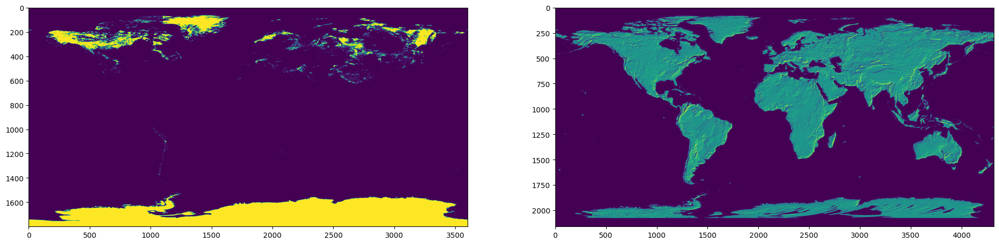

In [3]:
#open DEM and snow map from MODIS
alt_map_path = r'H:/GOES-16/2022/october/15/GDEM-10km-BW.tif'
aster_gdem_map = rasterio.open(alt_map_path).read(1)
snow_map_path = r'H:/SNOW_MAPS/2022/snow_15_apr.tiff'
snow_map = rasterio.open(snow_map_path).read(1)
snow_map[snow_map>254]=0
snow_map[snow_map>0]=255
print(np.unique(snow_map))
fig, ax = plt.subplots(1,2, figsize=(24,12))
ax[0].imshow(snow_map)
ax[1].imshow(aster_gdem_map)
plt.show()

**PROCESS DEM to ELECTRO L2 geostationary PROJECTION**

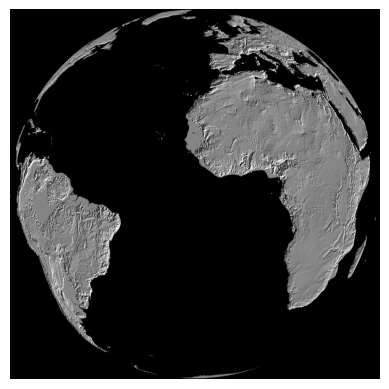

(5424, 5424)

In [5]:
plate_caree_crs = rasterio.crs.CRS.from_epsg(4326)
# Define Plate Carrée transform
aster_gdem_needed_resampled = interp_resize(aster_gdem_map, (3600//2,2*1800))
plate_caree_transform = rasterio.Affine(0.1, 0, -180, 0, -0.1, 90)
# Define the affine transformation coefficients for the geostationary projection
y_res = 2003.5 # 2 km resolution
x_res = 2003.5
sat_lon = -14.3 # satellite position - default is -14.5
goes16_transform = rasterio.Affine(x_res, 0, -5434894.675269887, 0, -y_res, 5434894.675269887)
# Define the geostationary projection CRS
goes16_crs = {'proj': 'geos', 
       'lon_0': sat_lon, 
       'h': 35786023.0,
        'a': 6378137.0,
        'b': 6356752.314, 
        'ellps': 'GRS80',
       'units': 'm',
        'sweep':'x',
       'no_defs': True}
# Define the output shape and resolution
out_shape = (5424, 5424)
out_transform = goes16_transform

# Reproject the plate caree snow map image to the geostationary projection

reprojected_alt_map = np.zeros(out_shape)
reproject(
    source=aster_gdem_needed_resampled,
    destination=reprojected_alt_map,
    src_transform=plate_caree_transform,
    src_crs=plate_caree_crs,
    dst_transform=goes16_transform,
    dst_crs=goes16_crs,
    resampling=Resampling.nearest)

# Visualize the reprojected snow map
plt.imshow(reprojected_alt_map, cmap='gray')
plt.axis('off')
plt.show()
tff.imsave(r'H:/ELECTRO_L2/2022/october/15/EL2_dem_gdal.tif',(reprojected_alt_map*255).astype(np.uint8))
reprojected_alt_map.shape

**REPEAT THE SAME REPROJECTING PROCEDURE FOR SNOW MAP FROM MODIS FOR ELECTRO L2 GEOS PROJECTION**

In [143]:
L2_lon = -14.3
L3_lon = 76.0
L4_lon = 165.8
Met9_lon = 45.5
Met10_lon = 0.0 #-2.0
years = ['2021','2021','2021','2021','2021','2021','2021']
years = ['2022','2022','2022','2022','2022','2022','2022','2022','2022','2022']
years = ['2023','2023','2023','2023']
snow_map_dir = r'H:/SNOW_MAPS/'
snow_map_paths = ['apr.tiff','may.tiff', 'june.tiff', 'july.tiff','aug.tiff','sep.tiff','oct.tiff']
snow_map_paths = ['feb.tiff','march.tiff', 'apr.tiff','may.tiff', 'june.tiff','july.tiff','aug.tiff','sep.tiff','oct.tiff','nov.tiff']
snow_map_paths = ['jan.tiff','feb.tiff','march.tiff', 'apr.tiff', 'may.tiff']
for i in range(len(snow_map_paths)):
    snow_map_path = snow_map_dir+years[i]+'/'+'snow_15_'
    try:
        snow_map = rasterio.open(snow_map_path+snow_map_paths[i]).read(1)
        if len(np.unique(snow_map))==2: print('already binarized!')
        else:
        #print(np.unique(snow_map))
            snow_map[snow_map>254]=0
            snow_map[snow_map>0]=255
    except:
        snow_map = rasterio.open(snow_map_path+snow_map_paths[i][:-1]).read(1)
        if len(np.unique(snow_map))==2: print('already binarized!')
        else:
        #print(np.unique(snow_map))
            snow_map[snow_map>254]=0
            snow_map[snow_map>0]=255
    sat_lon = L3_lon
    x_res = 2003#2003
    y_res = 2003#2004
    plate_caree_crs = rasterio.crs.CRS.from_epsg(4326)
    plate_caree_transform = rasterio.Affine(0.1, 0, -180, 0, -0.1, 90)
    goes16_transform = rasterio.Affine(x_res, 0, -5434894.675269887+5000, 0, -y_res, 5434894.675269887-5000)
    goes16_crs = {'proj': 'geos', 
           'lon_0': sat_lon, 
           'h': 35786023.0,
            'a': 6378137.0,
            'b': 6356752.314, 
            'ellps': 'GRS80',
           'units': 'm',
            'sweep':'x',
           'no_defs': True}
    snow_needed_resampled = interp_resize(snow_map, (3600//2,2*1800))
    snow_needed_resampled = (snow_needed_resampled*255).astype(np.uint8)
    print(np.unique(snow_needed_resampled))
    out_shape = (5424, 5424)
    out_transform = goes16_transform
    reprojected_snow_map = np.zeros(out_shape)
    reproject(
        source=snow_needed_resampled,
        destination=reprojected_snow_map,
        src_transform=plate_caree_transform,
        src_crs=plate_caree_crs,
        dst_transform=goes16_transform,
        dst_crs=goes16_crs,
        resampling=Resampling.nearest)
    # Visualize the reprojected snow map
#     plt.imshow(reprojected_snow_map, cmap='gray')
#     plt.axis('off')
#     plt.show()
    paths_save = ['april_15/','may_15/','june_15/','july_15/','august_15/','september_15/','octover_15/']
    paths_save = ['february_15/','march_15/','april_15/','may_15/','june_15/','july_15/','august_15/','september_15/','octover_15/','november_15/']
    paths_save = ['january_15/','february_15/','march_15/','april_15/','may_15/']
    dir_name = r'H:/GOES_16_17_DATASET\src\ELECTRO_L3/'+years[i]+'/'+paths_save[i]
    if not os.path.exists(dir_name):
        os.makedirs(dir_name)
    # saving to jpg leads to loss of binary mask, to preserve values only {0,255} we should use tff.imsave!!!!!!!!!
    tff.imsave(dir_name+'snow_map.jpg',(reprojected_snow_map).astype(np.uint8))
    # Image.fromarray((reprojected_snow_map).astype(np.uint8)).save(dir_name+'snow_map_jpg.jpg')
    # reprojected_snow_map.shape

[  0 255]
[  0 255]


C:\Users\nikita.belyakov\anaconda3\lib\site-packages\rasterio\__init__.py:319: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


already binarized!
[  0 255]


C:\Users\nikita.belyakov\anaconda3\lib\site-packages\rasterio\__init__.py:319: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


already binarized!
[  0 255]


IndexError: list index out of range

**OPTIONAL CELL: MAKE A COMPOSED ELECTRO L2 IMG WITH SNOW MAP TO SEE VISUAL RESULTS OF ACCURACY FOR PROJECTING PARAMETERS DEFINED FROM PLATE CAREE TO GEOS FOR ELECTRO L2**

(2784, 2784, 3)


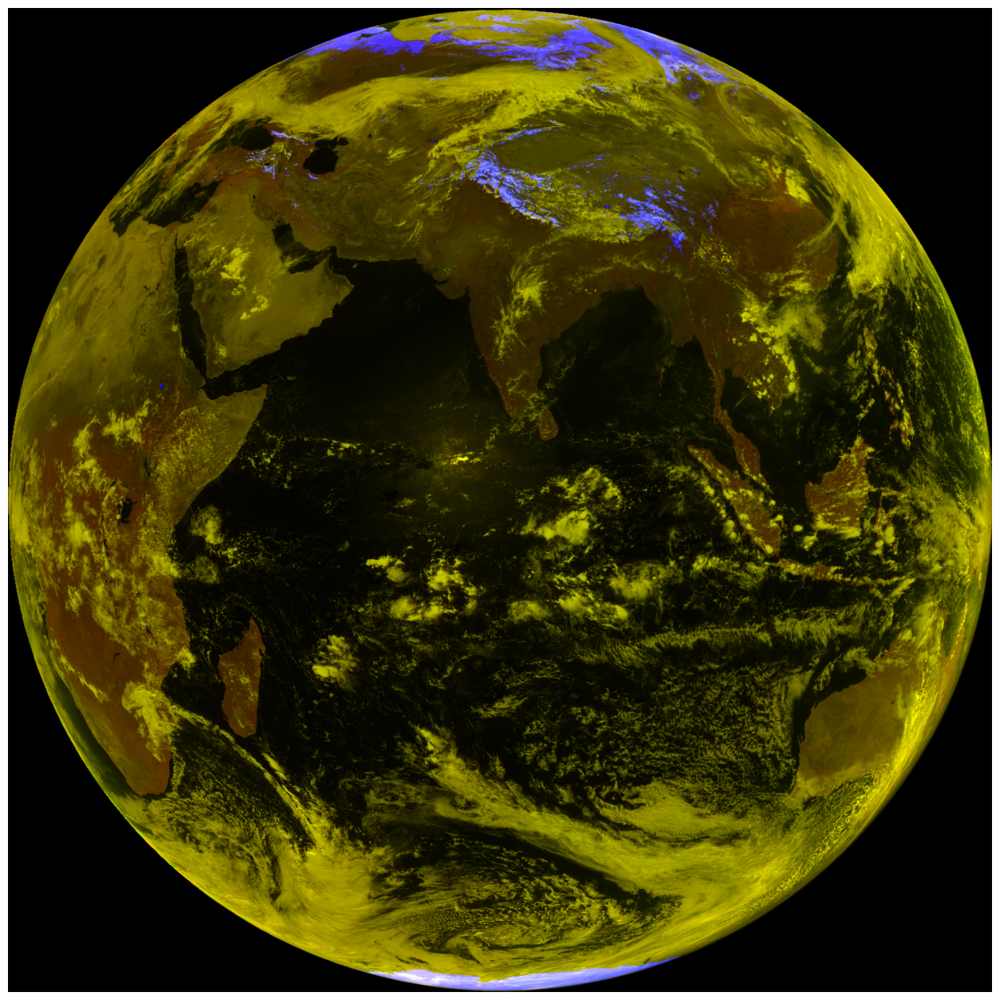

In [96]:
def shift_image(X, dx, dy):
    X = np.roll(X, dy, axis=0)
    X = np.roll(X, dx, axis=1)
    if dy>0:
        X[:dy, :] = 0
    elif dy<0:
        X[dy:, :] = 0
    if dx>0:
        X[:, :dx] = 0
    elif dx<0:
        X[:, dx:] = 0
    return X
# TRY TO ADOPT SHIFT OF ELECTRO L2 img FOR MARCH_15
rgb_EL2 = tff.imread(r'H:/GOES_16_17_DATASET\src\ELECTRO_L3/2023/april_15/ZSA/rgb_ZSA_0730.tif')
reprojected_snow_map = tff.imread(r'H:/GOES_16_17_DATASET\src\ELECTRO_L3/2023/april_15/snow_map.jpg')
padding = (11136-10848)//8
r,g,b = rgb_EL2[padding:-padding,padding:-padding,0],rgb_EL2[padding:-padding,padding:-padding,1],rgb_EL2[padding:-padding,padding:-padding,2]
print(rgb_EL2.shape)
r = (interp_resize(r, (5424,5424))*255).astype(np.uint8)
g = (interp_resize(g, (5424,5424))*255).astype(np.uint8)
b = (interp_resize(b, (5424,5424))*255).astype(np.uint8)
dx = 0 # for march imgs from ELECTRO L2
dy = 0 #-8 # for march imgs from ELECTRO L2
r = shift_image(r, dx, dy)
g = shift_image(g, dx, dy)
composed = np.dstack([r,g,(reprojected_snow_map).astype(np.uint8)])
Image.fromarray(composed).save(r'H:/GOES_16_17_DATASET\src\ELECTRO_L3/2023/april_15/rgb_with_snow_map_0730.jpg')
plt.figure(figsize = (16,16))
plt.imshow(composed, cmap='gray')
plt.axis('off')
plt.show()

(2784, 2784, 3)


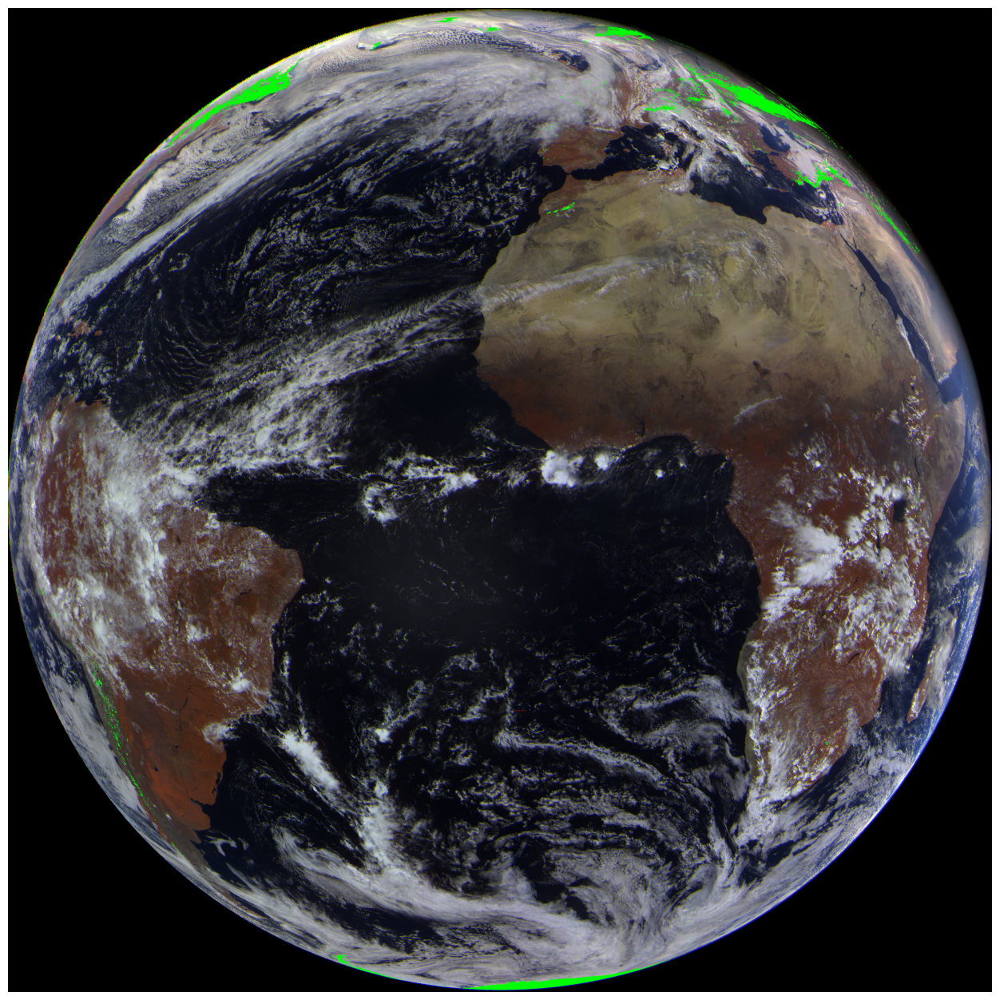

In [10]:
# TRY TO ADOPT SHIFT OF ELECTRO L2 img FOR JANUARY_15
rgb_EL2 = tff.imread(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/2022/february_15/ZSA/rgb_ZSA_1400.tif')
reprojected_snow_map = tff.imread(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/2022/february_15/snow_map.jpg')
padding = (11136-10848)//8
r,g,b = rgb_EL2[padding:-padding,padding:-padding,0],rgb_EL2[padding:-padding,padding:-padding,1],rgb_EL2[padding:-padding,padding:-padding,2]
print(rgb_EL2.shape)
r = (interp_resize(r, (5424,5424))*255).astype(np.uint8)
g = (interp_resize(g, (5424,5424))*255).astype(np.uint8)
b = (interp_resize(b, (5424,5424))*255).astype(np.uint8)
dx = -4 # for january_15 imgs from ELECTRO L2
dy = -6 # for january_15 imgs from ELECTRO L2
r = shift_image(r, dx, dy)
g = shift_image(g, dx, dy)
reprojected_snow_map = (reprojected_snow_map).astype(np.uint8)
r[reprojected_snow_map!=0] = 0
g[reprojected_snow_map!=0] = 255
b[reprojected_snow_map!=0] = 0
composed = np.dstack([r,g,b])
Image.fromarray(composed).save(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/2022/february_15/rgb_with_snow_map_1400.jpg')
plt.figure(figsize = (16,16))
plt.imshow(composed, cmap='gray')
plt.axis('off')
plt.show()

**NEXT STEPS TO MAKE SNOW MASK TRUE WITHOUT OVERLAPPING WITH CLOUD MASK (OPTIONAL)**

**NOW MULTIPLY CLOUD AND SNOW MASK TO REDUCE SNOW UNDER CLOUD AND GET TRUE SNOW MASKS FOR GOES**

unique cloud: [  0 255]
unique snow: [  0 255]
unique true_snow_mask: [  0 255]
check overlapping (should be zeros): [0]


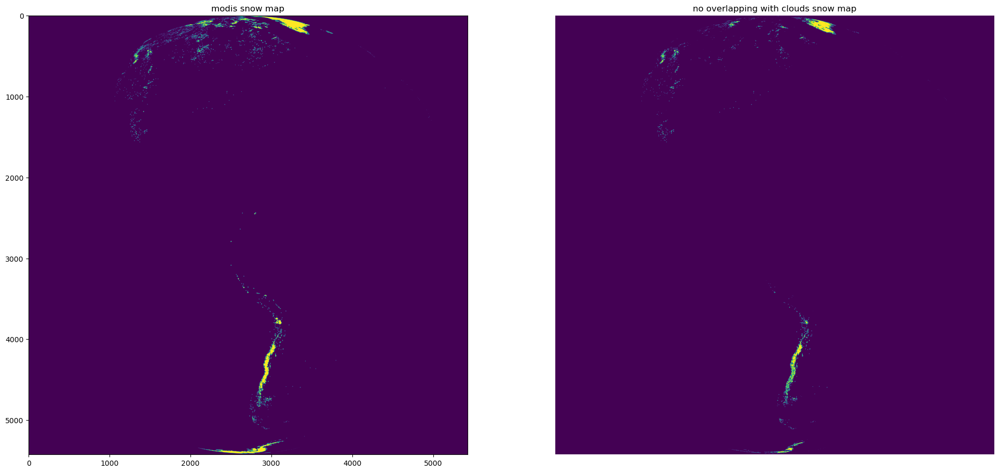

In [414]:
import tifffile as tff
goes_snow = tff.imread(r'H:\GOES_16_17_DATASET\src\GOES_16\october_15/goes16_snow_map.tif')
goes_cloud = tff.imread(r'H:\GOES_16_17_DATASET\src\GOES_16\october_15/cloud_mask_1700.jpg')

print('unique cloud:', np.unique(goes_cloud))
print('unique snow:', np.unique(goes_snow))
false_snow = ((goes_snow/255)*(goes_cloud/255)*255).astype(np.uint8)
true_snow_mask = goes_snow-false_snow
print('unique true_snow_mask:', np.unique(true_snow_mask))
check = true_snow_mask*goes_cloud
print('check overlapping (should be zeros):', np.unique(check))
fig, ax = plt.subplots(1,2, figsize=(24,12))
ax[0].imshow(goes_snow)
ax[1].imshow(true_snow_mask)
ax[0].set_title('modis snow map')
ax[1].set_title('no overlapping with clouds snow map')
plt.axis('off')
plt.show()
tff.imsave(r'H:\GOES_16_17_DATASET\src\GOES_16\october_15/true_snow_mask_1700.jpg',true_snow_mask)

**REPROJECT CLOUD MASKS OF GOES to ELECTRO_L SKIPPING PLATE CAREE PROJ STEP**

**TRY DEFAULT CORRECT PARAMETERS OF REPROJECTING**

In [136]:
times = ['1200','1400','1600']
years = ['2023','2023','2023','2023','2022','2021','2021','2021']
years = ['2021','2021']
# months = ['october_15','july_15', 'march_15','january_15']
# times = ['1600','1700']
# months = ['july_15', 'march_15','january_15']
# months = ['october_15']
#months = ['february_15', 'april_15', 'may_15','june_15', 'august_15','september_15','november_15','december_15']
months = ['february_15', 'march_15','april_15', 'may_15','january_15','october_15','november_15','december_15']
months = ['october_15','november_15']
#months = ['september_15','november_15','december_15']
j=0
for i in tqdm(range(len(months))):
    for time in times:
        try:
            rgb_GOES_cloud = tff.imread(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+years[i]+'/'+months[i]+'/cloud_mask_'+time+'.jpg')
            # Define the affine transformation coefficients for the geostationary projection
            y_res = x_res = 2000
            goes_16_lon = -75.
            # x0= y0 = 5568750
            x0 = y0 = 5586000-36*4000 #5434894.6752698875000
            goes16_transform = rasterio.Affine(x_res, 0, -x0, 0, -y_res, y0)
            # Define the geostationary projection CRS
            #h=35786000 +a=6378140 +b=6356750
            goes16_crs = {'proj': 'geos', 
                   'lon_0': goes_16_lon, 
                   'h': 35786000.0,
                    'a': 6378140.0,
                    'b': 6356750.314, 
                    'ellps': 'GRS80',
                   'units': 'm',
                    'sweep':'x',
                   'no_defs': True}
            # Define the output shape and resolution
            y_res = x_res = 4000 
            L2_lon = -14.5
            x_scew = 0.
            y_scew = 0.
            electro_l2_transform = rasterio.Affine(x_res, x_scew, -5586000, y_scew, -y_res, 5586000 )
            # Define the geostationary projection CRS
            electro_l2_crs = {'proj': 'geos', 
                   'lon_0': L2_lon, 
                   'h': 35788248.0,
                    'a': 6378137.0,
                    'b': 6356752.314, 
                    'ellps': 'GRS80',
                   'units': 'm',
                    'sweep':'x',
                   'no_defs': True}
            out_shape = (2784,2784)
            # Reproject the plate caree snow map image to the geostationary projection

            reprojected_GOES_cloud_to_plate = np.zeros(out_shape)
            # REPROJECTNG FUNCTION WORKS ABOUT 30 SECONDS -- BE PATIENT)!
            reproject(
                source=rgb_GOES_cloud,
                destination=reprojected_GOES_cloud_to_plate,
                dst_transform=electro_l2_transform,
                dst_crs=electro_l2_crs,
                src_transform=goes16_transform,
                src_crs=goes16_crs,
                resampling=Resampling.nearest)
            reprojected_GOES_cloud_to_plate = (reprojected_GOES_cloud_to_plate).astype(np.uint8)
            tif_dir = r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+years[i]+'/'+months[i]+'/GOES_16_cloud_mask_reprojected_'+time+'.jpg'
            tff.imsave(tif_dir,reprojected_GOES_cloud_to_plate)
            print('################ reprojected cloud mask successfully saved!')
            rgb_EL2 = tff.imread(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+years[i]+'/'+months[i]+'/ZSA/rgb_ZSA_'+time+'.tif')
            print('RGB_ZSA opened!')
            r,g,b = rgb_EL2[:,:,0],rgb_EL2[:,:,1],rgb_EL2[:,:,2]
            # RESIZE ELECTRO L2 IMG AND CUT ITS BORDERS to FIT CLOUD MASK FOR GOES-16
            EL2_pic_with_only_cloud_mask = np.dstack([r,g,reprojected_GOES_cloud_to_plate])
            filename_composed = r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+years[i]+'/'+months[i]+'/New_El2_with_cloud_mask_'+time+'.jpg'
            #Image.fromarray(EL2_pic_with_cloud_mask).save(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+years[i]+'/'+months[i]+'/El2_with_cloud_snow_mask_'+time+'.jpg')
            Image.fromarray(EL2_pic_with_only_cloud_mask).save(filename_composed)
            print('############ SAVED! #########')
        except:
            print('####### rgb does not exist!!! SKIP timestamp! #########')
    j=j+1

  0%|          | 0/2 [00:00<?, ?it/s]

####### rgb does not exist!!! SKIP timestamp! #########
####### rgb does not exist!!! SKIP timestamp! #########
####### rgb does not exist!!! SKIP timestamp! #########
################ reprojected cloud mask successfully saved!
RGB_ZSA opened!
############ SAVED! #########
################ reprojected cloud mask successfully saved!
RGB_ZSA opened!
############ SAVED! #########
################ reprojected cloud mask successfully saved!
RGB_ZSA opened!


100%|██████████| 2/2 [00:12<00:00,  6.03s/it]

############ SAVED! #########


**MY CUSTOM HANDMADE PARAMETERS FITTED**

In [137]:
#times = ['1230','1330','1430','1530']
# times = ['1200','1230','1300','1330','1400','1430','1500','1530','1600','1630','1700']
times = ['1200','1300','1400','1500']
times = ['1200','1400','1600']
years = ['2023','2023','2023','2023','2022','2021','2021','2021']
years = ['2021','2021']
# months = ['october_15','july_15', 'march_15','january_15']
# times = ['1600','1700']
# months = ['july_15', 'march_15','january_15']
# months = ['october_15']
#months = ['february_15', 'april_15', 'may_15','june_15', 'august_15','september_15','november_15','december_15']
months = ['february_15', 'march_15','april_15', 'may_15','january_15','october_15','november_15','december_15']
months = ['october_15','november_15']
#months = ['september_15','november_15','december_15']
x_ress = [2002,2002, 2002,2002]
y_ress = [2007,2007, 2007,2007]
dxs = [0,0,0,2]
dys = [0,0,0,2]
j=0
for i in tqdm(range(len(months))):
    for time in times:
        try:
            rgb_GOES_cloud = tff.imread(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+years[i]+'/'+months[i]+'/cloud_mask_'+time+'.jpg')
            # Define the affine transformation coefficients for the geostationary projection
            y_res = x_res = 2003
            sat_lon = -75.
            goes16_transform = rasterio.Affine(x_res, 0, -5434894.675269887+5000, 0, -y_res, 5434894.675269887-4000)
            # Define the geostationary projection CRS
            goes16_crs = {'proj': 'geos', 
                   'lon_0': sat_lon, 
                   'h': 35786023.0,
                    'a': 6378137.0,
                    'b': 6356752.314, 
                    'ellps': 'GRS80',
                   'units': 'm',
                    'sweep':'x',
                   'no_defs': True}
            # Define the output shape and resolution
            y_res = y_ress[0] #2007# 2km resolution
            x_res = x_ress[0] #2002
            sat_lon = -14.7
            x_scew = 0.7
            y_scew = 0.6
            electro_l2_transform = rasterio.Affine(x_res, x_scew, -5434894.675269887 +22000, y_scew, -y_res, 5434894.675269887+6000 )
            #electro_l2_transform = rasterio.Affine(x_res, x_scew, -5434894.675269887+22000 , y_scew, -y_res, 5434894.675269887+6000 )
            # Define the geostationary projection CRS
            electro_l2_crs = {'proj': 'geos', 
                   'lon_0': sat_lon, 
                   'h': 35786023.0,
                    'a': 6378137.0,
                    'b': 6356752.314, 
                    'ellps': 'GRS80',
                   'units': 'm',
                    'sweep':'x',
                   'no_defs': True}
            out_shape = (5424,5424)
            # Reproject the plate caree snow map image to the geostationary projection

            reprojected_GOES_cloud_to_plate = np.zeros(out_shape)
            # REPROJECTNG FUNCTION WORKS ABOUT 30 SECONDS -- BE PATIENT)!
            reproject(
                source=rgb_GOES_cloud,
                destination=reprojected_GOES_cloud_to_plate,
                dst_transform=electro_l2_transform,
                dst_crs=electro_l2_crs,
                src_transform=goes16_transform,
                src_crs=goes16_crs,
                resampling=Resampling.nearest)
            reprojected_GOES_cloud_to_plate = (reprojected_GOES_cloud_to_plate).astype(np.uint8)
            tif_dir = r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+years[i]+'/'+months[i]+'/cloud_mask_reprojected_'+time+'.jpg'
            tff.imsave(tif_dir,reprojected_GOES_cloud_to_plate)
            print('################ reprojected cloud mask successfully saved!')
            rgb_EL2 = tff.imread(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+years[i]+'/'+months[i]+'/ZSA/rgb_ZSA_'+time+'.tif')
            print('RGB_ZSA opened!')
            padding = (11136-10848)//8
            r,g,b = rgb_EL2[padding:-padding,padding:-padding,0],rgb_EL2[padding:-padding,padding:-padding,1],rgb_EL2[padding:-padding,padding:-padding,2]
            # RESIZE ELECTRO L2 IMG AND CUT ITS BORDERS to FIT CLOUD MASK FOR GOES-16
            r = (interp_resize(r, (5424,5424))*255).astype(np.uint8)
            g = (interp_resize(g, (5424,5424))*255).astype(np.uint8)
            b = (interp_resize(b, (5424,5424))*255).astype(np.uint8)
            r = shift_image(r, dxs[0], dys[0])
            g = shift_image(g, dxs[0], dys[0])
            b = shift_image(b, dxs[0], dys[0])
            rgb_EL2_ = np.dstack([r,g,b])
            l2_disk = r.copy()
            l2_disk[l2_disk>0]=1
            #reprojected_cloud_map_ = tff.imread(r'H:\ELECTRO_L2\2022\october\15\MSG/'+time+'_reproj.jpg')
            reprojected_GOES_cloud_to_plate = reprojected_GOES_cloud_to_plate*l2_disk
            print('try to open snow map---------------------')
            snow_mask_el2 = tff.imread(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+years[i]+'/'+months[i]+'/snow_map.jpg')
            print('SNOW MAP opened!')
            EL2_pic_with_cloud_mask = np.dstack([snow_mask_el2,g,reprojected_GOES_cloud_to_plate])
            EL2_pic_with_only_cloud_mask = np.dstack([r,g,reprojected_GOES_cloud_to_plate])
            Image.fromarray(EL2_pic_with_cloud_mask).save(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+years[i]+'/'+months[i]+'/El2_with_cloud_snow_mask_'+time+'.jpg')
            Image.fromarray(EL2_pic_with_only_cloud_mask).save(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+years[i]+'/'+months[i]+'/El2_with_cloud_mask_'+time+'.jpg')
            print('############ SAVED! #########')
        except:
            print('####### rgb does not exist!!! SKIP timestamp! #########')
    j=j+1

  0%|          | 0/1 [00:00<?, ?it/s]

################ reprojected cloud mask successfully saved!
RGB_ZSA opened!
try to open snow map---------------------
SNOW MAP opened!
############ SAVED! #########
################ reprojected cloud mask successfully saved!
RGB_ZSA opened!
try to open snow map---------------------
SNOW MAP opened!
############ SAVED! #########
################ reprojected cloud mask successfully saved!
RGB_ZSA opened!
try to open snow map---------------------
SNOW MAP opened!
############ SAVED! #########
################ reprojected cloud mask successfully saved!
RGB_ZSA opened!
try to open snow map---------------------
SNOW MAP opened!


100%|██████████| 1/1 [00:57<00:00, 57.68s/it]

############ SAVED! #########


**REPEAT THE SAME REPROJECTING FOR GOES-18 to ELECTRO L4**

In [75]:
times = ['2300','2330']
times_msk = ['0200.jpg','0230.jpg']
j=0
for time in times:
    try:
        rgb_GOES_cloud = tff.imread(r'H:/ELECTRO_L4\april\15/'+'cloud_mask_'+time+'.jpg')
        # Define the affine transformation coefficients for the geostationary projection
        y_res = x_res = 2003
        sat_lon = -136.9
        goes16_transform = rasterio.Affine(x_res, 0, -5434894.675269887+5000, 0, -y_res, 5434894.675269887-4000)
        # Define the geostationary projection CRS
        goes16_crs = {'proj': 'geos', 
               'lon_0': sat_lon, 
               'h': 35786023.0,
                'a': 6378137.0,
                'b': 6356752.314, 
                'ellps': 'GRS80',
               'units': 'm',
                'sweep':'x',
               'no_defs': True}
        # Define the output shape and resolution
        y_res = 2007# 2km resolution
        x_res = 2002
        sat_lon = 165.8
        x_scew = 0.7
        y_scew = 0.6
        electro_l2_transform = rasterio.Affine(x_res, x_scew, -5434894.675269887 +22000, y_scew, -y_res, 5434894.675269887+6000 )
        #electro_l2_transform = rasterio.Affine(x_res, x_scew, -5434894.675269887+22000 , y_scew, -y_res, 5434894.675269887+6000 )
        # Define the geostationary projection CRS
        electro_l2_crs = {'proj': 'geos', 
               'lon_0': sat_lon, 
               'h': 35786023.0,
                'a': 6378137.0,
                'b': 6356752.314, 
                'ellps': 'GRS80',
               'units': 'm',
                'sweep':'x',
               'no_defs': True}
        out_shape = (5424,5424)
        # Reproject the plate caree snow map image to the geostationary projection

        reprojected_GOES_cloud_to_plate = np.zeros(out_shape)
        # REPROJECTNG FUNCTION WORKS ABOUT 30 SECONDS -- BE PATIENT)!
        reproject(
            source=rgb_GOES_cloud,
            destination=reprojected_GOES_cloud_to_plate,
            dst_transform=electro_l2_transform,
            dst_crs=electro_l2_crs,
            src_transform=goes16_transform,
            src_crs=goes16_crs,
            resampling=Resampling.nearest)
        reprojected_GOES_cloud_to_plate = (reprojected_GOES_cloud_to_plate).astype(np.uint8)
        tif_dir = r'H:/ELECTRO_L4/april/15/'+'cloud_mask_reprojected_'+time+'.jpg'
        tff.imsave(tif_dir,reprojected_GOES_cloud_to_plate)
        print('################ reprojected cloud mask successfully saved!')
        #rgb_EL2 = np.array(Image.open(r'H:/ELECTRO_L4/april/15/'+time+'.jpg'))
        rgb_EL2 = np.array(Image.open(r'H:/ELECTRO_L4/april/16/'+times_msk[j]))#tff.imread(r'H:/ELECTRO_L4/april/16/'+times_msk[j])
        print('RGB_L4 opened!')
        padding = (11136-10848)//2
        r,g,b = rgb_EL2[padding:-padding,padding:-padding,0],rgb_EL2[padding:-padding,padding:-padding,1],rgb_EL2[padding:-padding,padding:-padding,2]
        # RESIZE ELECTRO L2 IMG AND CUT ITS BORDERS to FIT CLOUD MASK FOR GOES-16
        r = (interp_resize(r, (5424,5424))*255).astype(np.uint8)
        g = (interp_resize(g, (5424,5424))*255).astype(np.uint8)
        b = (interp_resize(b, (5424,5424))*255).astype(np.uint8)
        r = shift_image(r, dxs[0], dys[0])
        g = shift_image(g, dxs[0], dys[0])
        b = shift_image(b, dxs[0], dys[0])
        rgb_EL2_ = np.dstack([r,g,b])
        l2_disk = r.copy()
        l2_disk[l2_disk>0]=1
        #reprojected_cloud_map_ = tff.imread(r'H:\ELECTRO_L2\2022\october\15\MSG/'+time+'_reproj.jpg')
        reprojected_GOES_cloud_to_plate = reprojected_GOES_cloud_to_plate*l2_disk
        EL2_pic_with_only_cloud_mask = np.dstack([r,g,reprojected_GOES_cloud_to_plate])
        Image.fromarray(EL2_pic_with_only_cloud_mask).save(r'H:/ELECTRO_L4/april/15/'+'El4_with_cloud_mask_'+time+'.jpg')
        #Image.fromarray(EL2_pic_with_only_cloud_mask).save(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+years[i]+'/'+months[i]+'/El2_with_cloud_mask_'+time+'.jpg')
        print('############ SAVED! #########')
    except:
        print('####### rgb does not exist!!! SKIP timestamp! #########')
    j=j+1

################ reprojected cloud mask successfully saved!


C:\Users\nikita.belyakov\anaconda3\lib\site-packages\PIL\Image.py:3167: DecompressionBombWarning: Image size (124010496 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


RGB_L4 opened!
############ SAVED! #########
################ reprojected cloud mask successfully saved!


C:\Users\nikita.belyakov\anaconda3\lib\site-packages\PIL\Image.py:3167: DecompressionBombWarning: Image size (124010496 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


RGB_L4 opened!
############ SAVED! #########


**MAKE COMPOSED IMGS TO SEE IF IT LOOKS BETTER NOW**

**LETS TRY TO REPROJECT CLOUD MASKS FROM SEVIRI MSG**

In [140]:
out_shape = (5424, 5424)
times = ['1600']
months = ['october_15']
dates = ['cloud_mask_1600']
year ='2021'
padding = (11136-10848)//8
dxs = [0,0,0,2]
dys = [0,0,0,2]
i=0
x_ress = [2000,2002, 2002,2002]
y_ress = [2000,2007, 2007,2007]
for month in tqdm(months):
    for time in times:
        rgb_GOES_cloud = tff.imread(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+year+'/'+month+'/'+dates[i]+'.tif')
        rgb_GOES_cloud = np.array(Image.fromarray(rgb_GOES_cloud).resize((3616,3616),resample=Image.NEAREST)).astype(np.uint8)
        # Define the affine transformation coefficients for the geostationary projection
        y_res = x_res = 3000
        sat_lon = 0.
        goes16_transform = rasterio.Affine(x_res, 0, -5434894.675269887+5000, 0, -y_res, 5434894.675269887-4000)
        # Define the geostationary projection CRS
        goes16_crs = {'proj': 'geos', 
               'lon_0': sat_lon, 
               'h': 35786023.0,
                'a': 6378137.0,
                'b': 6356752.314, 
                'ellps': 'GRS80',
               'units': 'm',
                'sweep':'x',
               'no_defs': True}
        # Define the output shape and resolution
        y_res = 2000#y_ress[i] #2007# 2km resolution
        x_res = 2000#x_ress[i] #2002
        sat_lon = -14.7
        x_scew = 0.6
        y_scew = 0.7
        electro_l2_transform = rasterio.Affine(x_res, x_scew, -5434894.675269887 +22000, y_scew, -y_res, 5434894.675269887+6000 )
        electro_l2_crs = {'proj': 'geos', 
               'lon_0': sat_lon, 
               'h': 35786023.0,
                'a': 6378137.0,
                'b': 6356752.314, 
                'ellps': 'GRS80',
               'units': 'm',
                'sweep':'x',
               'no_defs': True}
        out_shape = (5424,5424)
        # Reproject the plate caree snow map image to the geostationary projection

        reprojected_GOES_cloud_to_plate = np.zeros(out_shape)
        # REPROJECTNG FUNCTION WORKS ABOUT 15 SECONDS -- BE PATIENT)!
        reproject(
            source=rgb_GOES_cloud,
            destination=reprojected_GOES_cloud_to_plate,
            dst_transform=electro_l2_transform,
            dst_crs=electro_l2_crs,
            src_transform=goes16_transform,
            src_crs=goes16_crs,
            resampling=Resampling.nearest)
        reprojected_GOES_cloud_to_plate = (reprojected_GOES_cloud_to_plate).astype(np.uint8)
        dx = 0
        dy = -4
        reprojected_cloud_map_ = shift_image(reprojected_GOES_cloud_to_plate, dx, dy)
        tff.imsave(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+year+'/'+month+'/'+dates[i]+'_MSG_reproj.tif',reprojected_cloud_map_)
        ######################################################
        
        rgb_EL2 = tff.imread(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+year+'/'+month+'/ZSA/rgb_ZSA_'+time+'.tif')
        r,g,b = rgb_EL2[padding:-padding,padding:-padding,0],rgb_EL2[padding:-padding,padding:-padding,1],rgb_EL2[padding:-padding,padding:-padding,2]
        # RESIZE ELECTRO L2 IMG AND CUT ITS BORDERS to FIT CLOUD MASK FOR GOES-16
        r = (interp_resize(r, (5424,5424))*255).astype(np.uint8)
        g = (interp_resize(g, (5424,5424))*255).astype(np.uint8)
        b = (interp_resize(b, (5424,5424))*255).astype(np.uint8)
        rgb_EL2_ = np.dstack([r,g,b])
        l2_disk = r.copy()
        l2_disk[l2_disk>0] = 1
        l2_disk = np.array(Image.fromarray(l2_disk).resize((3616,3616),resample=Image.NEAREST)).astype(np.uint8)
        reprojected_earth_disk = np.zeros(out_shape)
        reproject(
            source=l2_disk,
            destination=reprojected_earth_disk,
            dst_transform=electro_l2_transform,
            dst_crs=electro_l2_crs,
            src_transform=goes16_transform,
            src_crs=goes16_crs,
            resampling=Resampling.nearest)
        reprojected_earth_disk = (reprojected_earth_disk).astype(np.uint8)
        tff.imsave(r'H:/GOES_16_17_DATASET/src/ELECTRO_L2/earth_disk_from_Met_10.jpg',(reprojected_earth_disk*255).astype(np.uint8))
        ########################################################
        #reprojected_cloud_map_ = tff.imread(r'H:\ELECTRO_L2\2022\october\15\MSG/'+dates[i]+'_reproj.jpg')
        #reprojected_cloud_map_ = reprojected_cloud_map_*l2_disk
        #snow_mask_el2 = tff.imread(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+year+'/'+month+'/snow_map'+'.jpg')
        #EL2_pic_with_cloud_mask = np.dstack([snow_mask_el2,g,reprojected_cloud_map_])
        EL2_pic_with_only_cloud_mask = np.dstack([r,g,reprojected_cloud_map_])
        #Image.fromarray(EL2_pic_with_cloud_mask).save(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+year+'/'+month+'/El2_with_cloud_snow_mask_MSG_'+time+'.jpg')
        Image.fromarray(EL2_pic_with_only_cloud_mask).save(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+year+'/'+month+'/El2_with_cloud_mask_MSG_'+time+'.jpg')
        print('############ SAVED! #########')
    i = i + 1

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:21<00:00, 21.20s/it]

############ SAVED! #########


**REPEAT REPROJECTION FROM MET10 TO L2 USING IKI PARAMETERS**

In [21]:
months = ['january','february','march','april','may','june','july','august','september','october','november','december']
months = ['january','february','march','april','may']
#months = ['october','november','december']
times = ['1200','1230','1300','1330','1400','1430','1500','1530','1600','1630','1700']
#times = ['1200','1400','1600']
year ='2023'
i=0
for month in tqdm(months):
    for time in times:
        try:
            cloud_dir = r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+year+'/'+month+'_15/'+'cloud_mask_'+time+'.tif'
            # . tif - MSG cloud mask
            # .jpg - GOES cloud mask
            Met_10_cloud = tff.imread(cloud_dir)
            Met_10_cloud = np.pad(Met_10_cloud,(48,48))
            print('Met_10 cloud mask shape', Met_10_cloud.shape)
            # Define the affine transformation coefficients for the geostationary projection
            y_res = x_res = 3000
            sat_lon = 0.
            x0, y0 = -5586000, 5586000
            Met_10_transform = rasterio.Affine(x_res, 0, x0, 0, -y_res, y0)
            # Define the geostationary projection CRS
            Met_10_crs = {'proj': 'geos', 
                   'lon_0': sat_lon, 
                   'h': 35786360.0,
                    'a': 6378137.0,
                    'b': 6356752.314, 
                    'ellps': 'GRS80',
                   'units': 'm',
                    'sweep':'x',
                   'no_defs': True}
            # Define the output shape and resolution
            y_res = 4000
            x_res = 4000
            sat_lon = -14.5
            x_scew = 0.
            y_scew = 0.
            x0, y0 = -5586000, 5586000
            electro_l2_transform = rasterio.Affine(x_res, x_scew, x0, y_scew, -y_res, y0 )
            electro_l2_crs = {'proj': 'geos', 
                   'lon_0': sat_lon, 
                   'h': 35788248.0,
                    'a': 6378137.0,
                    'b': 6356752.314, 
                    'ellps': 'GRS80',
                   'units': 'm',
                    'sweep':'x',
                   'no_defs': True}
            out_shape = (2784,2784)
            # Reproject the plate caree snow map image to the geostationary projection

            reprojected_Met_10_cloud = np.zeros(out_shape)
            # REPROJECTNG FUNCTION WORKS ABOUT 15 SECONDS -- BE PATIENT)!
            reproject(
                source = Met_10_cloud,
                destination = reprojected_Met_10_cloud,
                dst_transform = electro_l2_transform,
                dst_crs=electro_l2_crs,
                src_transform = Met_10_transform,
                src_crs = Met_10_crs,
                resampling = Resampling.nearest)
            reprojected_Met_10_cloud = (reprojected_Met_10_cloud).astype(np.uint8)
            reproj_cloud_dir = r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+year+'/'+month+'_15/'+time+'_Met_10_reproj.tif'
            tff.imsave(reproj_cloud_dir,reprojected_Met_10_cloud)
            ######################################################
            rgb_EL2 = tff.imread(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+year+'/'+month+'_15/ZSA/rgb_ZSA_'+time+'.tif')
            print('RGB file successfully opened!')
            r,g,b = rgb_EL2[:,:,0],rgb_EL2[:,:,1],rgb_EL2[:,:,2]
            rgb_EL2_ = np.dstack([r,g,b])
            EL2_pic_with_only_cloud_mask = np.dstack([r,g,reprojected_Met_10_cloud])
            img_composed_dir = r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+year+'/'+month+'_15/El2_with_cloud_mask_Met_10_'+time+'.jpg'
            Image.fromarray(EL2_pic_with_only_cloud_mask).save(img_composed_dir)
            print('file processed:', img_composed_dir)
            print('############ REPROECTED CLOUD MASK FROM MET10 SAVED! #########')
        except: 
            print('STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP')
    i = i + 1

  0%|          | 0/5 [00:00<?, ?it/s]

Met_10 cloud mask shape (3712, 3712)
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
Met_10 cloud mask shape (3712, 3712)
RGB file successfully opened!
file processed: H:/GOES_16_17_DATASET\src\ELECTRO_L2/2023/january_15/El2_with_cloud_mask_Met_10_1230.jpg
############ REPROECTED CLOUD MASK FROM MET10 SAVED! #########
Met_10 cloud mask shape (3712, 3712)
RGB file successfully opened!
file processed: H:/GOES_16_17_DATASET\src\ELECTRO_L2/2023/january_15/El2_with_cloud_mask_Met_10_1300.jpg
############ REPROECTED CLOUD MASK FROM MET10 SAVED! #########
Met_10 cloud mask shape (3712, 3712)
RGB file successfully opened!
file processed: H:/GOES_16_17_DATASET\src\ELECTRO_L2/2023/january_15/El2_with_cloud_mask_Met_10_1330.jpg
############ REPROECTED CLOUD MASK FROM MET10 SAVED! #########
Met_10 cloud mask shape (3712, 3712)
RGB file successfully opened!
file processed: H:/GOES_16_17_DATASET\src\ELECTRO_L2/2023/january_15/El2_with_cloud_mask_Met_10_1400.jpg
############ REPROECTED

 20%|██        | 1/5 [00:41<02:44, 41.21s/it]

file processed: H:/GOES_16_17_DATASET\src\ELECTRO_L2/2023/january_15/El2_with_cloud_mask_Met_10_1700.jpg
############ REPROECTED CLOUD MASK FROM MET10 SAVED! #########
Met_10 cloud mask shape (3712, 3712)
RGB file successfully opened!
file processed: H:/GOES_16_17_DATASET\src\ELECTRO_L2/2023/february_15/El2_with_cloud_mask_Met_10_1200.jpg
############ REPROECTED CLOUD MASK FROM MET10 SAVED! #########
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
Met_10 cloud mask shape (3712, 3712)
RGB file successfully opened!
file processed: H:/GOES_16_17_DATASET\src\ELECTRO_L2/2023/february_15/El2_with_cloud_mask_Met_10_1400.jpg
############ REPROECTED CLOUD MASK FROM MET10 SAVED! #########
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> T

 40%|████      | 2/5 [00:53<01:12, 24.24s/it]

file processed: H:/GOES_16_17_DATASET\src\ELECTRO_L2/2023/february_15/El2_with_cloud_mask_Met_10_1600.jpg
############ REPROECTED CLOUD MASK FROM MET10 SAVED! #########
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
Met_10 cloud mask shape (3712, 3712)
RGB file successfully opened!
file processed: H:/GOES_16_17_DATASET\src\ELECTRO_L2/2023/march_15/El2_with_cloud_mask_Met_10_1200.jpg
############ REPROECTED CLOUD MASK FROM MET10 SAVED! #########
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
Met_10 cloud mask shape (3712, 3712)
RGB file successfully opened!
file processed: H:/GOES_16_17_DATASET\src\ELECTRO_L2/2023/march_15/El2_with_cloud_mask_Met_10_1400.jpg
############ REPROECTED CLOUD MASK FROM MET10 SAVED! #########
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NE

 60%|██████    | 3/5 [01:05<00:37, 18.59s/it]

file processed: H:/GOES_16_17_DATASET\src\ELECTRO_L2/2023/march_15/El2_with_cloud_mask_Met_10_1600.jpg
############ REPROECTED CLOUD MASK FROM MET10 SAVED! #########
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
Met_10 cloud mask shape (3712, 3712)
RGB file successfully opened!
file processed: H:/GOES_16_17_DATASET\src\ELECTRO_L2/2023/april_15/El2_with_cloud_mask_Met_10_1200.jpg
############ REPROECTED CLOUD MASK FROM MET10 SAVED! #########
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
Met_10 cloud mask shape (3712, 3712)
RGB file successfully opened!
file processed: H:/GOES_16_17_DATASET\src\ELECTRO_L2/2023/april_15/El2_with_cloud_mask_Met_10_1400.jpg
############ REPROECTED CLOUD MASK FROM MET10 SAVED! #########
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT 

 80%|████████  | 4/5 [01:14<00:14, 14.89s/it]

file processed: H:/GOES_16_17_DATASET\src\ELECTRO_L2/2023/april_15/El2_with_cloud_mask_Met_10_1600.jpg
############ REPROECTED CLOUD MASK FROM MET10 SAVED! #########
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
Met_10 cloud mask shape (3712, 3712)
RGB file successfully opened!
file processed: H:/GOES_16_17_DATASET\src\ELECTRO_L2/2023/may_15/El2_with_cloud_mask_Met_10_1200.jpg
############ REPROECTED CLOUD MASK FROM MET10 SAVED! #########
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
Met_10 cloud mask shape (3712, 3712)
RGB file successfully opened!
file processed: H:/GOES_16_17_DATASET\src\ELECTRO_L2/2023/may_15/El2_with_cloud_mask_Met_10_1400.jpg
############ REPROECTED CLOUD MASK FROM MET10 SAVED! #########
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIME

100%|██████████| 5/5 [01:24<00:00, 16.85s/it]

file processed: H:/GOES_16_17_DATASET\src\ELECTRO_L2/2023/may_15/El2_with_cloud_mask_Met_10_1600.jpg
############ REPROECTED CLOUD MASK FROM MET10 SAVED! #########
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP


**PARSE AND REPROJECT CLOUD AND SNOW PRODUCTS FROM VISCONSIN FTP MET9**

In [11]:
def parse_visconsin_met9_with_L3_reproj(data_dir,file_name, month, day, time, plot = False, make_compose = False):
    L_dir = r'H:\ELECTRO_DATASET\4_km_res/L3_visconsin/'
    file_path_b = data_dir+file_name
    f_b = nc.Dataset(file_path_b)
    cloud_mask = np.array(f_b['cloud_type'])
    snow_class = np.array(f_b['snow_class'])
    snow = snow_class.copy()
    snow[snow>10000] =0
    snow[snow<2] =0
    snow[snow!=0]=1
    #0=clear,1=probably clear,2=fog,3=water,4=supercooled water,5=mixed,6=opaque_ice,
    #7=cirrus,8=overlapping,9=overshooting,10=unknown,11=dust,12=smoke,13=fire
    cloud_mask[cloud_mask>10000] =0
    cloud_mask[cloud_mask<0] =0
    snow_class[snow_class>10000] =0
    snow_class[snow_class<2]=0
    cloud_mask[cloud_mask==3]=0
    cloud_mask[cloud_mask==4]=0
    cloud_mask[cloud_mask==1]=0
    cloud_mask[cloud_mask==13]=0
    cloud_mask[cloud_mask==11]=0
    BCM_no_fog = cloud_mask.copy()
    BCM_no_fog[BCM_no_fog==2]=0
    BCM_no_fog[BCM_no_fog==12]=0
    BCM_no_fog[BCM_no_fog!=0]=1
    snow_overlapped = snow*BCM_no_fog
    fog = cloud_mask.copy()
    fog[fog==12]=2
    fog[fog!=2]=0
    fog[fog!=0]=1
    fog = (fog*255).astype(np.uint8)
    BCM_no_fog = (BCM_no_fog*255).astype(np.uint8)
    snow=(snow*255).astype(np.uint8)
    #print(np.unique(fog),np.unique(BCM_no_fog),np.unique(snow))
    
    y_res = x_res = 3000
    Met_9_lon = 45.5
    x0, y0 = -5586000, 5586000
    Met_9_transform = rasterio.Affine(x_res, 0, x0, 0, -y_res, y0)
    # Define the geostationary projection CRS
    Met_9_crs = {'proj': 'geos', 
           'lon_0': Met_9_lon, 
           'h': 35786360.0,
            'a': 6378137.0,
            'b': 6356752.314, 
            'ellps': 'GRS80',
           'units': 'm',
            'sweep':'x',
           'no_defs': True}
    # Define the output shape and resolution
    y_res = 4000
    x_res = 4000
    L3_lon = 76.
    x_scew = 0.
    y_scew = 0.
    x0, y0 = -5586000, 5586000
    electro_l3_transform = rasterio.Affine(x_res, x_scew, x0, y_scew, -y_res, y0 )
    electro_l3_crs = {'proj': 'geos', 
           'lon_0': L3_lon, 
           'h': 35788248.0,
            'a': 6378137.0,
            'b': 6356752.314, 
            'ellps': 'GRS80',
           'units': 'm',
            'sweep':'x',
           'no_defs': True}
    out_shape = (2784,2784)
    # Reproject the plate caree snow map image to the geostationary projection
    reprojected_cloud_Met_9 = np.zeros(out_shape)
    reprojected_snow_Met_9 = np.zeros(out_shape)
    reprojected_fog_Met_9 = np.zeros(out_shape)
    reproject(source = BCM_no_fog,destination = reprojected_cloud_Met_9,dst_transform = electro_l3_transform,
        dst_crs=electro_l3_crs,src_transform = Met_9_transform,src_crs = Met_9_crs,resampling = Resampling.nearest)
    reproject(source = snow,destination = reprojected_snow_Met_9,dst_transform = electro_l3_transform,
        dst_crs=electro_l3_crs,src_transform = Met_9_transform,src_crs = Met_9_crs,resampling = Resampling.nearest)
    reproject(source = fog,destination = reprojected_fog_Met_9,dst_transform = electro_l3_transform,
        dst_crs=electro_l3_crs,src_transform = Met_9_transform,src_crs = Met_9_crs,resampling = Resampling.nearest)
    reprojected_cloud_Met_9 = (reprojected_cloud_Met_9).astype(np.uint8)
    reprojected_snow_Met_9 = (reprojected_snow_Met_9).astype(np.uint8)
    reprojected_fog_Met_9 = (reprojected_fog_Met_9).astype(np.uint8)
    reproj_cloud_name = L_dir+'cloud_2023'+month+day+time+'_Met_9_reproj.jpg'
    reproj_fog_name = L_dir+'fog_2023'+month+day+time+'_Met_9_reproj.jpg'
    reproj_snow_name = L_dir+'snow_2023'+month+day+time+'_Met_9_reproj.jpg'
    tff.imsave(reproj_cloud_name,reprojected_cloud_Met_9)
    tff.imsave(reproj_snow_name,reprojected_snow_Met_9)
    tff.imsave(reproj_fog_name,reprojected_fog_Met_9)
    ######################################################
    if make_compose:
        rgb_EL3 = tff.imread(L_dir+month+day+'/ZSA/rgb_ZSA_'+time+'.tif')
        r,g,b = rgb_EL3[:,:,0],rgb_EL3[:,:,1],rgb_EL3[:,:,2]
        EL3_pic_with_only_cloud_mask = np.dstack([r,g,reprojected_cloud_Met_9])
        img_name = L_dir+month+day+'/El3_with_cloud_mask_Met_9_'+time+'.jpg'
        Image.fromarray(EL3_pic_with_only_cloud_mask).save(img_name)
    #print(img_name)
    print('############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########')
    if plot:
        fig, ax = plt.subplots(1,3, figsize=(32,16))
        ax[0].imshow(reprojected_fog_Met_9)
        ax[1].imshow(reprojected_cloud_Met_9)
        ax[2].imshow(reprojected_snow_Met_9)
        #titles
        ax[0].set_title('fog')
        ax[1].set_title('BCM_no_fog')
        ax[2].set_title('snow+ice')
        plt.show()
# except: 
#     print('STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP')
data_dir = r'H:VISCONTI_MSG/Met_9/'

months = ['06','07']
days_06 = ['20','21','22','23','24','25','26','27','28','28','30']
days_07 = ['01','02','03','04','05','06','07','08','09','10','11','12','13','14']
times = ['0500','0600','0700','0800','0900']
for i in tqdm(range(len(days_07))):
    for time in times:
        month = months[1]
        if month == '06':
            file_name = 'clavrx_met9_2023_'+str(i+171)+'_'+time+'.level2.hdf'
        else:
            file_name = 'clavrx_met9_2023_'+str(i+182)+'_'+time+'.level2.hdf'
        try:parse_visconsin_met9_with_L3_reproj(data_dir,file_name,month,days_07[i], time, plot =False, make_compose = False)
        except:(print('THIS TIMESTAMP DOES NOT EXIST:',file_name))

  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########


  7%|█████▉                                                                             | 1/14 [00:52<11:20, 52.36s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########


 14%|███████████▊                                                                       | 2/14 [01:47<10:50, 54.24s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########


 21%|█████████████████▊                                                                 | 3/14 [02:41<09:50, 53.72s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########


 29%|███████████████████████▋                                                           | 4/14 [03:33<08:52, 53.21s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########


 36%|█████████████████████████████▋                                                     | 5/14 [04:25<07:56, 52.97s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########


 43%|███████████████████████████████████▌                                               | 6/14 [05:17<06:59, 52.41s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########


 50%|█████████████████████████████████████████▌                                         | 7/14 [06:07<06:01, 51.62s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########


 57%|███████████████████████████████████████████████▍                                   | 8/14 [07:00<05:12, 52.05s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########


 64%|█████████████████████████████████████████████████████▎                             | 9/14 [07:54<04:24, 52.82s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########


 71%|██████████████████████████████████████████████████████████▌                       | 10/14 [08:47<03:31, 52.84s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########


 79%|████████████████████████████████████████████████████████████████▍                 | 11/14 [09:40<02:38, 52.72s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########


 86%|██████████████████████████████████████████████████████████████████████▎           | 12/14 [10:31<01:44, 52.27s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########


 93%|████████████████████████████████████████████████████████████████████████████▏     | 13/14 [11:24<00:52, 52.41s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [12:16<00:00, 52.61s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_9 to L3 SAVED! #########


**MAKE THE SAME REPROJECTING FUNCTION FOR VISCONSIN DATA FROM MET10**

In [9]:
def parse_visconsin_met10_with_L2_reproj(data_dir,file_name, month, day, time, plot = False, make_compose = False):
    L_dir = r'H:\ELECTRO_DATASET\4_km_res/L2_visconsin/'
    file_path_b = data_dir+file_name
    f_b = nc.Dataset(file_path_b)
    cloud_mask = np.array(f_b['cloud_type'])
    snow_class = np.array(f_b['snow_class'])
    snow = snow_class.copy()
    snow[snow>10000] =0
    snow[snow<2] =0
    snow[snow!=0]=1
    #0=clear,1=probably clear,2=fog,3=water,4=supercooled water,5=mixed,6=opaque_ice,
    #7=cirrus,8=overlapping,9=overshooting,10=unknown,11=dust,12=smoke,13=fire
    cloud_mask[cloud_mask>10000] =0
    cloud_mask[cloud_mask<0] =0
    snow_class[snow_class>10000] =0
    snow_class[snow_class<2]=0
    cloud_mask[cloud_mask==3]=0
    cloud_mask[cloud_mask==4]=0
    cloud_mask[cloud_mask==1]=0
    cloud_mask[cloud_mask==13]=0
    cloud_mask[cloud_mask==11]=0
    BCM_no_fog = cloud_mask.copy()
    BCM_no_fog[BCM_no_fog==2]=0
    BCM_no_fog[BCM_no_fog==12]=0
    BCM_no_fog[BCM_no_fog!=0]=1
    snow_overlapped = snow*BCM_no_fog
    fog = cloud_mask.copy()
    fog[fog==12]=2
    fog[fog!=2]=0
    fog[fog!=0]=1
    fog = (fog*255).astype(np.uint8)
    BCM_no_fog = (BCM_no_fog*255).astype(np.uint8)
    snow=(snow*255).astype(np.uint8)
    y_res = x_res = 3000
    Met_10_lon = 0
    x0, y0 = -5586000, 5586000
    Met_10_transform = rasterio.Affine(x_res, 0, x0, 0, -y_res, y0)
    # Define the geostationary projection CRS
    Met_10_crs = {'proj': 'geos', 
           'lon_0': Met_10_lon, 
           'h': 35786360.0,
            'a': 6378137.0,
            'b': 6356752.314, 
            'ellps': 'GRS80',
           'units': 'm',
            'sweep':'x',
           'no_defs': True}
    # Define the output shape and resolution
    y_res = 4000
    x_res = 4000
    L2_lon = -14.5
    x_scew = 0.
    y_scew = 0.
    x0, y0 = -5586000, 5586000
    electro_l2_transform = rasterio.Affine(x_res, x_scew, x0, y_scew, -y_res, y0 )
    electro_l2_crs = {'proj': 'geos', 
           'lon_0': L2_lon, 
           'h': 35788248.0,
            'a': 6378137.0,
            'b': 6356752.314, 
            'ellps': 'GRS80',
           'units': 'm',
            'sweep':'x',
           'no_defs': True}
    out_shape = (2784,2784)
    # Reproject the plate caree snow map image to the geostationary projection
    reprojected_cloud_Met_10 = np.zeros(out_shape)
    reprojected_snow_Met_10 = np.zeros(out_shape)
    reprojected_fog_Met_10 = np.zeros(out_shape)
    reproject(source = BCM_no_fog,destination = reprojected_cloud_Met_10,dst_transform = electro_l2_transform,
        dst_crs=electro_l2_crs,src_transform = Met_10_transform,src_crs = Met_10_crs,resampling = Resampling.nearest)
    reproject(source = snow,destination = reprojected_snow_Met_10,dst_transform = electro_l2_transform,
        dst_crs=electro_l2_crs,src_transform = Met_10_transform,src_crs = Met_10_crs,resampling = Resampling.nearest)
    reproject(source = fog,destination = reprojected_fog_Met_10,dst_transform = electro_l2_transform,
        dst_crs=electro_l2_crs,src_transform = Met_10_transform,src_crs = Met_10_crs,resampling = Resampling.nearest)
    reprojected_cloud_Met_10 = (reprojected_cloud_Met_10).astype(np.uint8)
    reprojected_snow_Met_10 = (reprojected_snow_Met_10).astype(np.uint8)
    reprojected_fog_Met_10 = (reprojected_fog_Met_10).astype(np.uint8)
    reproj_cloud_name = L_dir+'cloud_2023'+month+day+time+'_Met_10_reproj.jpg'
    reproj_fog_name = L_dir+'fog_2023'+month+day+time+'_Met_10_reproj.jpg'
    reproj_snow_name = L_dir+'snow_2023'+month+day+time+'_Met_10_reproj.jpg'
    tff.imsave(reproj_cloud_name,reprojected_cloud_Met_10)
    tff.imsave(reproj_snow_name,reprojected_snow_Met_10)
    tff.imsave(reproj_fog_name,reprojected_fog_Met_10)
    ######################################################
    if make_compose:
        rgb_EL2 = tff.imread(L_dir+month+day+'/ZSA/rgb_ZSA_'+time+'.tif')
        r,g,b = rgb_EL2[:,:,0],rgb_EL2[:,:,1],rgb_EL2[:,:,2]
        EL2_pic_with_only_cloud_mask = np.dstack([r,g,reprojected_cloud_Met_10])
        img_name = L_dir+month+day+'/El2_with_cloud_mask_Met_10_'+time+'.jpg'
        Image.fromarray(EL2_pic_with_only_cloud_mask).save(img_name)
    #print(img_name)
    print('############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########')
    if plot:
        fig, ax = plt.subplots(1,3, figsize=(32,16))
        ax[0].imshow(reprojected_fog_Met_10)
        ax[1].imshow(reprojected_cloud_Met_10)
        ax[2].imshow(reprojected_snow_Met_10)
        #titles
        ax[0].set_title('fog')
        ax[1].set_title('BCM_no_fog')
        ax[2].set_title('snow+ice')
        plt.show()
# except: 
#     print('STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP')
data_dir = r'H:VISCONTI_MSG/Met_10/'
months = ['06','07']
days_06 = ['20','21','22','23','24','25','26','27','28','29','30']
days_07 = ['01','02','03','04','05','06','07','08','09','10','11','12','13','14']
times = ['1200','1300','1400','1500','1600','1700']
for i in tqdm(range(len(days_07))):
    for time in times:
        month = months[1]
        if month == '06':
            file_name = 'clavrx_met10_2023_'+str(i+171)+'_'+time+'.level2.hdf'
        else:
            file_name = 'clavrx_met10_2023_'+str(i+182)+'_'+time+'.level2.hdf'
        try:parse_visconsin_met10_with_L2_reproj(data_dir,file_name,month,days_07[i], time, plot =False, make_compose = False)
        except:(print('THIS TIMESTAMP DOES NOT EXIST:',file_name))

  0%|                                                                                           | 0/14 [00:00<?, ?it/s]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########


  7%|█████▉                                                                             | 1/14 [01:05<14:17, 65.96s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########


 14%|███████████▊                                                                       | 2/14 [02:10<13:04, 65.39s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########


 21%|█████████████████▊                                                                 | 3/14 [03:17<12:04, 65.86s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########


 29%|███████████████████████▋                                                           | 4/14 [04:25<11:08, 66.88s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########


 36%|█████████████████████████████▋                                                     | 5/14 [05:36<10:15, 68.36s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########


 43%|███████████████████████████████████▌                                               | 6/14 [06:45<09:08, 68.53s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########


 50%|█████████████████████████████████████████▌                                         | 7/14 [07:55<08:03, 69.03s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########


 57%|███████████████████████████████████████████████▍                                   | 8/14 [09:03<06:52, 68.68s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########


 64%|█████████████████████████████████████████████████████▎                             | 9/14 [10:07<05:36, 67.26s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########


 71%|██████████████████████████████████████████████████████████▌                       | 10/14 [11:14<04:27, 66.95s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########


 79%|████████████████████████████████████████████████████████████████▍                 | 11/14 [12:19<03:19, 66.40s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########


 86%|██████████████████████████████████████████████████████████████████████▎           | 12/14 [13:27<02:13, 66.94s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########


 93%|████████████████████████████████████████████████████████████████████████████▏     | 13/14 [14:34<01:06, 66.92s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########
############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [15:40<00:00, 67.20s/it]

############ REPROJECTED CLOUD, FOG & SNOW FROM MET_10 to L2 SAVED! #########


**REPROJECT MET10 DEM to L2 POSITION**

  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

Met_10 DEM shape (3712, 3712)


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.83s/it]

############ REPROJECTED DEM FROM MET10 SAVED! #########


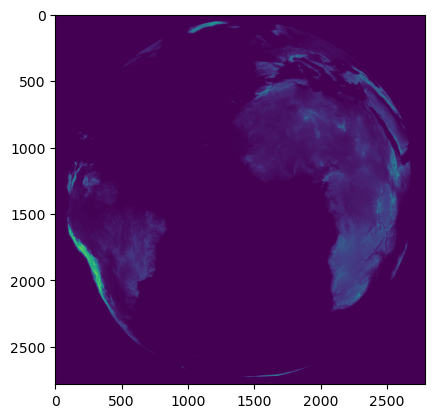

In [170]:

times = ['1400']
times = ['1400']
months = ['october_15']
dates = ['cloud_mask_1400']
year ='2021'
for month in tqdm(months):
    for time in times:
        DEM = tff.imread(r'H:\VISCONTI_MSG/Elevation_Met10.tif')
        print('Met_10 DEM shape', DEM.shape)
        rgb_EL2 = tff.imread(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+year+'/'+month+'/ZSA/rgb_ZSA_'+time+'.tif')
        r,g,b = rgb_EL2[:,:,0],rgb_EL2[:,:,1],rgb_EL2[:,:,2]
        # RESIZE ELECTRO L2 IMG AND CUT ITS BORDERS to FIT CLOUD MASK FOR GOES-16
        rgb_EL2_ = np.dstack([r,g,b])
        y_res = x_res = 3000
        sat_lon = 0.
        x0, y0 = -5586000, 5586000
        Met_10_transform = rasterio.Affine(x_res, 0, x0, 0, -y_res, y0)
        # Define the geostationary projection CRS
        Met_10_crs = {'proj': 'geos', 
               'lon_0': sat_lon, 
               'h': 35786360.0,
                'a': 6378137.0,
                'b': 6356752.314, 
                'ellps': 'GRS80',
               'units': 'm',
                'sweep':'x',
               'no_defs': True}
        # Define the output shape and resolution
        y_res = 4000#y_ress[i] #2007# 2km resolution
        x_res = 4000#x_ress[i] #2002
        sat_lon = -14.5
        x_scew = 0.
        y_scew = 0.
        x0, y0 = -5586000, 5586000
        electro_l2_transform = rasterio.Affine(x_res, x_scew, x0, y_scew, -y_res, y0 )
        electro_l2_crs = {'proj': 'geos', 
               'lon_0': sat_lon, 
               'h': 35788248.0,
                'a': 6378137.0,
                'b': 6356752.314, 
                'ellps': 'GRS80',
               'units': 'm',
                'sweep':'x',
               'no_defs': True}
        out_shape = (2784,2784)
        # Reproject the plate caree snow map image to the geostationary projection
        reprojected_DEM = np.zeros(out_shape)
        reproject(
            source = DEM,
            destination = reprojected_DEM,
            dst_transform = electro_l2_transform,
            dst_crs=electro_l2_crs,
            src_transform = Met_10_transform,
            src_crs = Met_10_crs,
            resampling = Resampling.nearest)
        #reprojected_DEM = (reprojected_DEM).astype(np.uint8)
        plt.imshow(reprojected_DEM)
        
        tff.imsave(r'H:/GOES_16_17_DATASET/src/ELECTRO_L2/DEM_from_Met_10.tif',(reprojected_DEM))
        reprojected_DEM_uint8 = (reprojected_DEM/np.max(reprojected_DEM)*255).astype(np.uint8)
        EL2_pic_with_DEM = np.dstack([reprojected_DEM_uint8,r,g])
        Image.fromarray(EL2_pic_with_DEM).save(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/EL2_pic_with_DEM.jpg')
         #Image.fromarray(EL2_pic_with_only_cloud_mask).save(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+year+'/'+month+'/El2_with_cloud_mask_MSG_'+time+'.jpg')
        print('############ REPROJECTED DEM FROM MET10 SAVED! #########')

**MERGE 2 EARTH DISKS FROM SEVIRI & GOES-16**

(2784, 2784) (2784, 2784)


(array([  0, 255], dtype=uint8), array([  0, 255]), (2784, 2784), (2784, 2784))

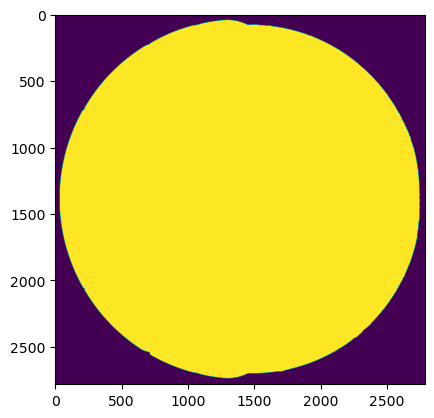

In [127]:
goes_disk = tff.imread(r'H:\GOES_16_17_DATASET\src\ELECTRO_L2/reprojected_el_2_earth_disk.jpg')
goes_disk = np.array(Image.fromarray(goes_disk).resize((2712,2712),resample=Image.NEAREST))
goes_disk = np.pad(goes_disk, (36,36))
#msg_disk = tff.imread(r'H:\GOES_16_17_DATASET\src\ELECTRO_L2/earth_disk_from_Met_10.tif')
met_10_disk_path = r'H:\GOES_16_17_DATASET\src\ELECTRO_L2/Met_10_reproj.tif'
met_10_disk = np.array(Image.open(met_10_disk_path)).mean(axis = 2).astype(int)
met_10_disk[met_10_disk<255]=0
print(goes_disk.shape, met_10_disk.shape)
#msg_disk[msg_disk<250]=0
composed_disks = met_10_disk+goes_disk
composed_disks[composed_disks!=0]=255
plt.imshow(composed_disks)
tff.imsave(r'H:\GOES_16_17_DATASET\src\ELECTRO_L2/masks_of_Met_10_and_GOES_16_for_L2.tif',composed_disks.astype(np.uint8))
np.unique(goes_disk),np.unique(composed_disks),met_10_disk.shape, composed_disks.shape

In [62]:
#from PIL import ImageChops OLD! DO NOT USE!!!
seviri_mask_path = r'H:\GOES_16_17_DATASET\src\ELECTRO_L2\2022\october\15\MSG/cloud_mask_1200_reproj.jpg'
goes_mask_path = r'H:\GOES_16_17_DATASET\src\ELECTRO_L2\2022\october_15\cloud_mask_geos2geos_reprojected_1200.jpg'
def join_2_masks_L2(goes_mask_path, seviri_mask_path, save_path, save_composed = True):
    MSG_cloud = tff.imread(seviri_mask_path)
    GOES_cloud = tff.imread(goes_mask_path)
    if MSG_cloud.shape[0] != 5424:
        MSG_cloud = (interp_resize(MSG_cloud, (5424,5424))*255).astype(np.uint8)
    if GOES_cloud.shape[0] != 5424:
        GOES_cloud = (interp_resize(GOES_cloud, (5424,5424))*255).astype(np.uint8)
    GOES_cloud[:,5424//2:] = np.zeros((5424,5424-5424//2)).astype(np.uint8)
    MSG_cloud[:,:5424//4] = np.zeros((5424,5424//4)).astype(np.uint8)
    stacked_mask = GOES_cloud+MSG_cloud
    stacked_mask[stacked_mask!=0] = 255
    tff.imsave(save_path, stacked_mask)
    if save_composed:
        padding = (11136-10848)//8
        rgb_EL2 = tff.imread(goes_mask_path.replace('cloud_mask_geos2geos_reprojected_1200.jpg','ZSA/rgb_ZSA_1200.tif'))
        r,g,b = rgb_EL2[padding:-padding,padding:-padding,0],rgb_EL2[padding:-padding,padding:-padding,1],rgb_EL2[padding:-padding,padding:-padding,2]
        # RESIZE ELECTRO L2 IMG AND CUT ITS BORDERS to FIT CLOUD MASK FOR GOES-16
        r = (interp_resize(r, (5424,5424))*255).astype(np.uint8)
        g = (interp_resize(g, (5424,5424))*255).astype(np.uint8)
        EL2_pic_with_only_cloud_mask = np.dstack([r,g,stacked_mask])
        Image.fromarray(EL2_pic_with_only_cloud_mask).save(goes_mask_path.replace('geos2geos_reprojected','full_composed'))
save_path = r'H:\GOES_16_17_DATASET\src\ELECTRO_L2\2022\october_15\joined_cloud_masks_1200.jpg'
join_2_masks_L2(goes_mask_path, seviri_mask_path, save_path)

**MERGE 2 CLOUD MASKS FROM MEt10 & GOES-16 for allL2 images**

In [141]:
def join_2_masks_L2_4km_res(year, month, time, save_composed = True, show = False):
    default_dir = r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'
    Met10_dir = default_dir + 'masks_of_Met_10_and_GOES_16_for_L2.tif'
    Met10_disk = tff.imread(Met10_dir)//255
    met_10_disk_path = default_dir+'Met_10_reproj.tif'
    goes_eart_disk_path = default_dir+'reprojected_el_2_earth_disk.jpg'
    goes_mask_path = default_dir + year + '/' + month+ '_15/'+ 'cloud_mask_reprojected_'+time+'.jpg'
    seviri_mask_path = default_dir + year + '/' + month+ '_15/'+time+'_Met_10_reproj.tif'
    save_path = default_dir + year + '/' + month+ '_15/both_cloud_mask_'+time+'.tif'
    save_path_jpg = default_dir + year + '/' + month+ '_15/L2_with_both_cloud_mask_'+time+'.jpg'
    rgb_path = default_dir + year + '/' + month+ '_15/ZSA/rgb_ZSA_'+time+'.tif'
    MSG_cloud = tff.imread(seviri_mask_path)
    GOES_cloud = tff.imread(goes_mask_path)
    met_10_disk = np.array(Image.open(met_10_disk_path)).mean(axis = 2).astype(int)
    met_10_disk[met_10_disk<255]=0
    #goes_disk = tff.imread(goes_eart_disk_path)
    met_10_disk=np.abs(met_10_disk-255)//255
    if GOES_cloud.shape[0] != 2784:
        GOES_cloud = np.array(Image.fromarray(GOES_cloud).resize((2712,2712),resample=Image.NEAREST))
        GOES_cloud = np.pad(GOES_cloud, ((36,36),(36,36)))
    MSG_cloud = MSG_cloud//255
    GOES_cloud = GOES_cloud//255
    GOES_cloud = GOES_cloud*met_10_disk
    stacked_mask = MSG_cloud+GOES_cloud
    stacked_mask[stacked_mask!=0] = 255
    stacked_mask = stacked_mask.astype(np.uint8)
    #print(np.unique(stacked_mask))
    tff.imsave(save_path, stacked_mask)
    if show:
        fig, ax = plt.subplots(1,2, figsize=(24,12))
        ax[0].imshow(GOES_cloud)
        ax[1].imshow(stacked_mask)
        ax[0].set_title('GOES_cloud needed')
        ax[1].set_title('both masks')
        plt.show()
    if save_composed:
        rgb_EL2 = tff.imread(rgb_path)
        r,g,b = rgb_EL2[:,:,0],rgb_EL2[:,:,1],rgb_EL2[:,:,2]
        r = r*Met10_disk
        g = g*Met10_disk
        # RESIZE ELECTRO L2 IMG AND CUT ITS BORDERS to FIT CLOUD MASK FOR GOES-16
        EL2_pic_with_only_cloud_mask = np.dstack([r,g,stacked_mask])
        Image.fromarray(EL2_pic_with_only_cloud_mask).save(save_path_jpg)
    print(seviri_mask_path, ' PROCCESSED AND SAVED! ')
year = '2022'
months = ['january','february','march','april','may','june','july','august','september','october','november','december']
times = ['1200','1230','1300','1330','1400','1430','1500','1530','1600','1630','1700']
months = ['october']#,'february','march','april','may','june','july','august','september','october','november','december']
times = ['1200','1300','1400','1500']
for month in tqdm(months):
    for time in times:
        try:
            join_2_masks_L2_4km_res(year, month, time)
        except:
            print('FILE/ timestamp DOES NOT EXIST!---> next')

  0%|          | 0/1 [00:00<?, ?it/s]

H:/GOES_16_17_DATASET\src\ELECTRO_L2/2022/october_15/1200_Met_10_reproj.tif  PROCCESSED AND SAVED! 
H:/GOES_16_17_DATASET\src\ELECTRO_L2/2022/october_15/1300_Met_10_reproj.tif  PROCCESSED AND SAVED! 
H:/GOES_16_17_DATASET\src\ELECTRO_L2/2022/october_15/1400_Met_10_reproj.tif  PROCCESSED AND SAVED! 


100%|██████████| 1/1 [00:02<00:00,  2.78s/it]

H:/GOES_16_17_DATASET\src\ELECTRO_L2/2022/october_15/1500_Met_10_reproj.tif  PROCCESSED AND SAVED! 


**CHECK CORRECTNESS OF MET-10 disks for cloud masks**

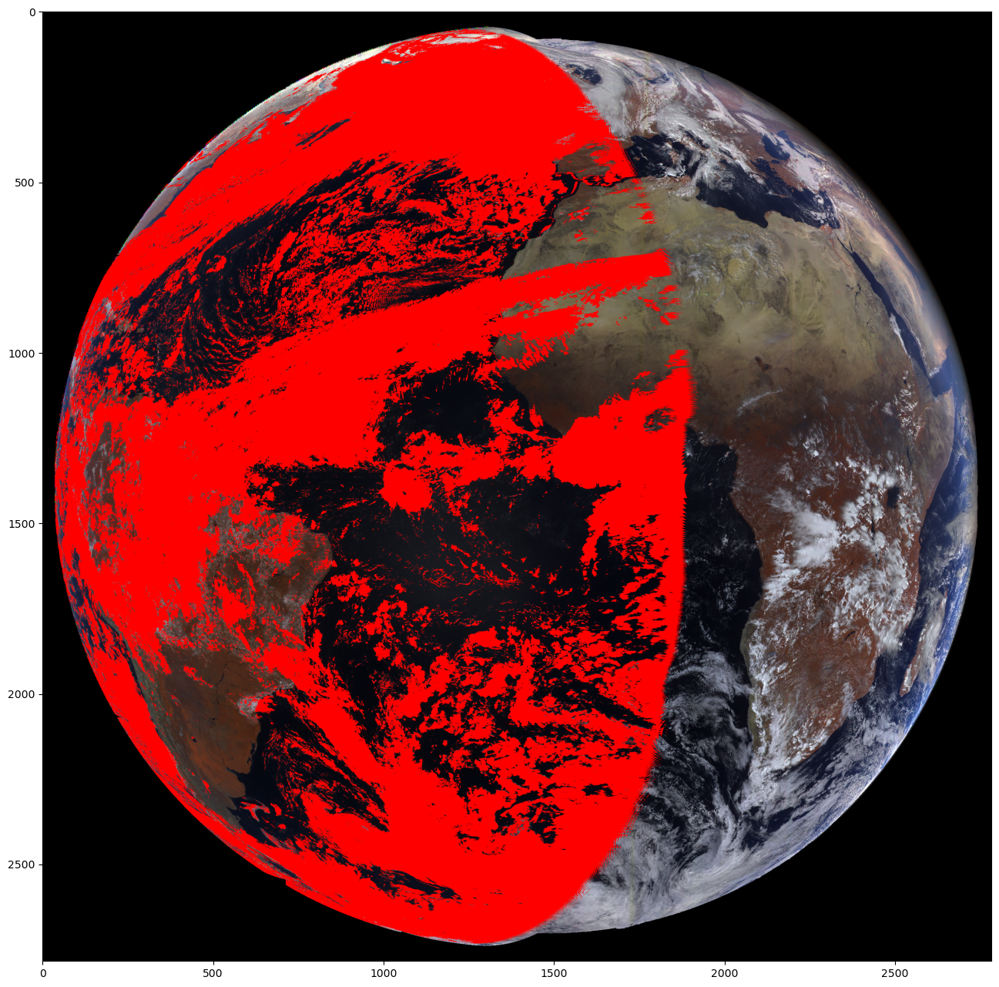

In [30]:
dxs = [-2]
dys = [-2]
default_dir = r'H:/GOES_16_17_DATASET/src/ELECTRO_L2/'
Met10_dir = default_dir + 'masks_of_Met_10_and_GOES_16_for_L2.tif'
rgb_dir = default_dir+ '2022/february_15/ZSA/rgb_ZSA_1400.tif'
Met10_cloud_mask_dir = default_dir+ '2022/february_15/both_cloud_mask_1400.tif'
Met10_cloud_mask_dir = default_dir+ '2022/february_15/cloud_mask_reprojected_1400.jpg'
Met10_cloud_mask = tff.imread(Met10_cloud_mask_dir)
# Met10_cloud_mask=(interp_resize(Met10_cloud_mask, (2784,2784))*255).astype(np.uint8)
rgb_EL2 = tff.imread(rgb_dir)
r,g,b = rgb_EL2[:,:,0],rgb_EL2[:,:,1],rgb_EL2[:,:,2]
# r = shift_image(r, dxs[0], dys[0])
# g = shift_image(g, dxs[0], dys[0])
# b = shift_image(b, dxs[0], dys[0])
# rgb_EL2_ = np.dstack([r,g,b])
Met10_disk = tff.imread(Met10_dir)//255
if Met10_cloud_mask.shape[0] != 2784:
    Met10_cloud_mask = np.array(Image.fromarray(Met10_cloud_mask).resize((2712,2712),resample=Image.NEAREST))
    Met10_cloud_mask = np.pad(Met10_cloud_mask, ((36,36),(36,36)))

# add cloud mask
r[Met10_cloud_mask!=0] = 255
g[Met10_cloud_mask!=0] = 0
b[Met10_cloud_mask!=0] = 0
# add snow
# reprojected_snow = (interp_resize(reprojected_snow_map, (2784,2784))*255).astype(np.uint8)
# r[reprojected_snow!=0] = 0
# g[reprojected_snow!=0] = 255
# b[reprojected_snow!=0] = 0
# add met10 earth disk area
r = r*Met10_disk
g = g*Met10_disk
b = b*Met10_disk
EL2_pic_with_cloud_mask_for_train = np.dstack([r,g,b])
plt.figure(figsize=(16,16))
plt.imshow(EL2_pic_with_cloud_mask_for_train)
plt.show()
# save_path_jpg = default_dir+ '2022/may_15/EL2_pic_with_cloud_mask_for_train.jpg'
# Image.fromarray(EL2_pic_with_cloud_mask_for_train).save(save_path_jpg)

**CHECK CORRECTNESS OF MET-8 & MET-9 disks for cloud masks**

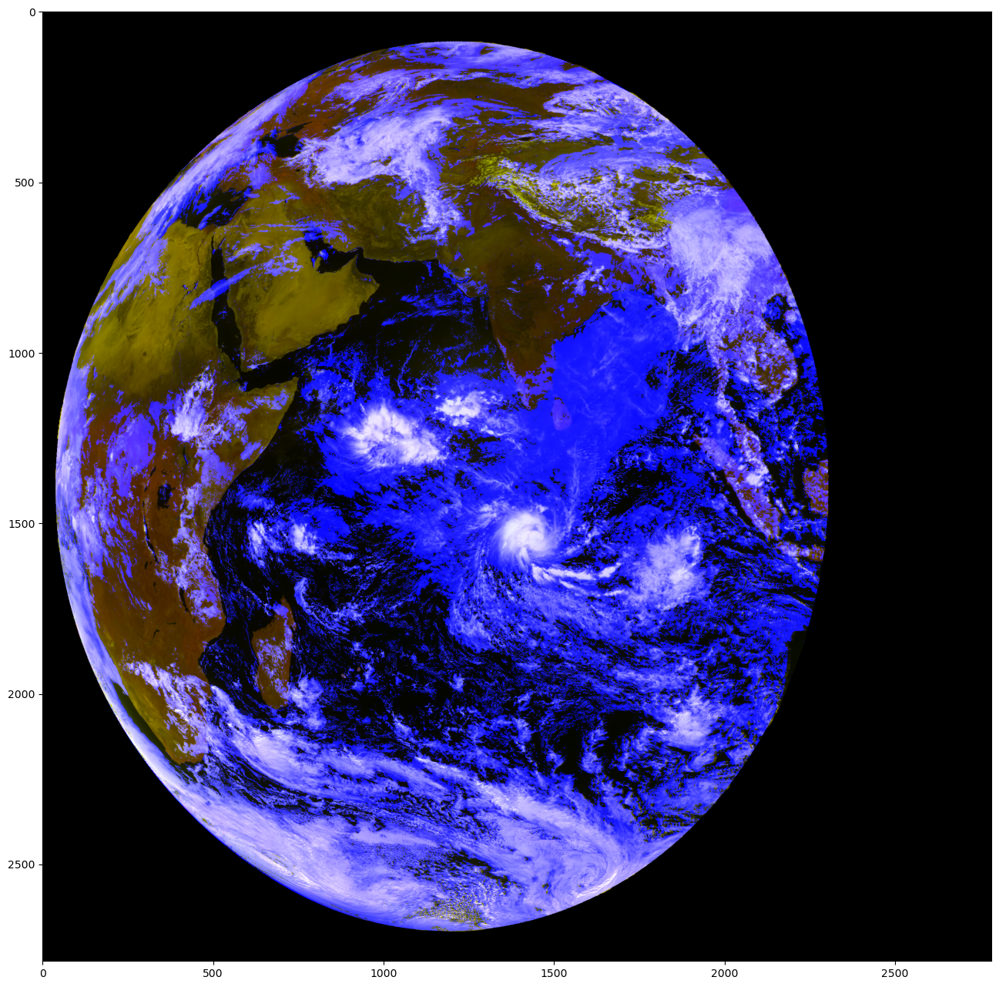

In [146]:
default_dir = r'H:/GOES_16_17_DATASET/src/ELECTRO_L3/'
Met8_dir = default_dir + 'Met_9_reproj.jpg'
rgb_dir = default_dir+ '2023/may_15/ZSA/rgb_ZSA_0730.tif'
Met8_cloud_mask_dir = default_dir+ '2023/may_15/cloud_0730_Met_9_reproj.jpg'
Met8_cloud_mask = tff.imread(Met8_cloud_mask_dir)
rgb_EL3 = tff.imread(rgb_dir)
r,g,b = rgb_EL3[:,:,0],rgb_EL3[:,:,1],rgb_EL3[:,:,2]
#Met8_disk = tff.imread(Met8_dir)//255
Met8_disk = np.array(Image.open(Met8_dir)).mean(axis = 2).astype(int)
Met8_disk[Met8_disk<255]=0
Met8_disk=(Met8_disk//255).astype(np.uint8)
r = r*Met8_disk
g = g*Met8_disk
EL3_pic_with_cloud_mask_for_train = np.dstack([r,g,Met8_cloud_mask])
plt.figure(figsize=(16,16))
plt.imshow(EL3_pic_with_cloud_mask_for_train)
plt.show()
# save_path_jpg = default_dir+ '2021/may_15/EL3_pic_with_cloud_mask_for_train.jpg'
# Image.fromarray(EL3_pic_with_cloud_mask_for_train).save(save_path_jpg)

**DO THE SAME FOR MSG METEOSAT-9 FOR ELECTRO L3**

In [116]:
year = '/2023/'
months = ['april','may','june','july','august','september','october']
months = ['january','february','march','april','may']
months = ['june','july','august','september','october','november','december']
months = ['january','february','march','april','may']
times = ['0600','0730','0900']
times = ['0530','0600','0630','0700','0730','0800','0830','0900','0930']
i=0
for month in tqdm(months):
    for time in times:
        try:
            Met_9_cloud = tff.imread(r'H:/GOES_16_17_DATASET\src\ELECTRO_L3'+year+month+'_15/cloud_mask_'+time+'.tif')
            Met_9_cloud = np.pad(Met_9_cloud, (48,48))
    #         plt.imshow(Met_9_cloud)
            print('init cloud_mask shape', Met_9_cloud.shape)
            # Define the affine transformation coefficients for the geostationary projection
            y_res = x_res = 3000
            Met_9_lon = 45.5
            x0, y0 = -5586000, 5586000
            Met_9_transform = rasterio.Affine(x_res, 0, x0, 0, -y_res, y0)
            # Define the geostationary projection CRS
            Met_9_crs = {'proj': 'geos', 
                   'lon_0': Met_9_lon, 
                   'h': 35786360.0,
                    'a': 6378137.0,
                    'b': 6356752.314, 
                    'ellps': 'GRS80',
                   'units': 'm',
                    'sweep':'x',
                   'no_defs': True}
            # Define the output shape and resolution
            y_res = 4000
            x_res = 4000
            L3_lon = 76.
            x_scew = 0.
            y_scew = 0.
            x0, y0 = -5586000, 5586000
            electro_l3_transform = rasterio.Affine(x_res, x_scew, x0, y_scew, -y_res, y0 )
            electro_l3_crs = {'proj': 'geos', 
                   'lon_0': L3_lon, 
                   'h': 35788248.0,
                    'a': 6378137.0,
                    'b': 6356752.314, 
                    'ellps': 'GRS80',
                   'units': 'm',
                    'sweep':'x',
                   'no_defs': True}
            out_shape = (2784,2784)
            # Reproject the plate caree snow map image to the geostationary projection
            reprojected_cloud_Met_9 = np.zeros(out_shape)
            reproject(
                source = Met_9_cloud,
                destination = reprojected_cloud_Met_9,
                dst_transform = electro_l3_transform,
                dst_crs=electro_l3_crs,
                src_transform = Met_9_transform,
                src_crs = Met_9_crs,
                resampling = Resampling.nearest)
            reprojected_cloud_Met_9 = (reprojected_cloud_Met_9).astype(np.uint8)
            reproj_cloud_name = r'H:/GOES_16_17_DATASET\src\ELECTRO_L3'+year+month+'_15/cloud_'+time+'_Met_9_reproj.jpg'
            tff.imsave(reproj_cloud_name,reprojected_cloud_Met_9)
            ######################################################
            rgb_EL3 = tff.imread(r'H:/GOES_16_17_DATASET\src\ELECTRO_L3'+year+month+'_15/ZSA/rgb_ZSA_'+time+'.tif')
            r,g,b = rgb_EL3[:,:,0],rgb_EL3[:,:,1],rgb_EL3[:,:,2]
            EL3_pic_with_only_cloud_mask = np.dstack([r,g,reprojected_cloud_Met_9])
            img_name = r'H:/GOES_16_17_DATASET\src\ELECTRO_L3'+year+month+'_15/El3_with_cloud_mask_Met_9_'+time+'.jpg'
            Image.fromarray(EL3_pic_with_only_cloud_mask).save(img_name)
            print(img_name)
            print('############ REPROJECTED CLOUD FROM MET_9 to L3 SAVED! #########')
        except: 
            print('STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP')

  0%|          | 0/5 [00:00<?, ?it/s]

STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
init cloud_mask shape (3712, 3712)


 20%|██        | 1/5 [00:04<00:16,  4.07s/it]

H:/GOES_16_17_DATASET\src\ELECTRO_L3/2023/january_15/El3_with_cloud_mask_Met_9_0700.jpg
############ REPROJECTED CLOUD FROM MET_9 to L3 SAVED! #########
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
init cloud_mask shape (3712, 3712)
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
init cloud_mask shape (3712, 3712)
H:/GOES_16_17_DATASET\src\ELECTRO_L3/2023/february_15/El3_with_cloud_mask_Met_9_0730.jpg
############ REPROJECTED CLOUD FROM MET_9 to L3 SAVED! #########
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIM

 40%|████      | 2/5 [00:15<00:24,  8.18s/it]

H:/GOES_16_17_DATASET\src\ELECTRO_L3/2023/february_15/El3_with_cloud_mask_Met_9_0900.jpg
############ REPROJECTED CLOUD FROM MET_9 to L3 SAVED! #########
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
init cloud_mask shape (3712, 3712)
H:/GOES_16_17_DATASET\src\ELECTRO_L3/2023/march_15/El3_with_cloud_mask_Met_9_0600.jpg
############ REPROJECTED CLOUD FROM MET_9 to L3 SAVED! #########
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
init cloud_mask shape (3712, 3712)
H:/GOES_16_17_DATASET\src\ELECTRO_L3/2023/march_15/El3_with_cloud_mask_Met_9_0730.jpg
############ REPROJECTED CLOUD FROM MET_9 to L3 SAVED! #########
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
init cloud_mask shape (3712, 3712)


 60%|██████    | 3/5 [00:26<00:19,  9.60s/it]

H:/GOES_16_17_DATASET\src\ELECTRO_L3/2023/march_15/El3_with_cloud_mask_Met_9_0900.jpg
############ REPROJECTED CLOUD FROM MET_9 to L3 SAVED! #########
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
init cloud_mask shape (3712, 3712)
H:/GOES_16_17_DATASET\src\ELECTRO_L3/2023/april_15/El3_with_cloud_mask_Met_9_0600.jpg
############ REPROJECTED CLOUD FROM MET_9 to L3 SAVED! #########
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
init cloud_mask shape (3712, 3712)
H:/GOES_16_17_DATASET\src\ELECTRO_L3/2023/april_15/El3_with_cloud_mask_Met_9_0730.jpg
############ REPROJECTED CLOUD FROM MET_9 to L3 SAVED! #########
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
init cloud_mask shape (3712, 3712)


 80%|████████  | 4/5 [00:38<00:10, 10.41s/it]

H:/GOES_16_17_DATASET\src\ELECTRO_L3/2023/april_15/El3_with_cloud_mask_Met_9_0900.jpg
############ REPROJECTED CLOUD FROM MET_9 to L3 SAVED! #########
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
init cloud_mask shape (3712, 3712)
H:/GOES_16_17_DATASET\src\ELECTRO_L3/2023/may_15/El3_with_cloud_mask_Met_9_0600.jpg
############ REPROJECTED CLOUD FROM MET_9 to L3 SAVED! #########
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
init cloud_mask shape (3712, 3712)
H:/GOES_16_17_DATASET\src\ELECTRO_L3/2023/may_15/El3_with_cloud_mask_Met_9_0730.jpg
############ REPROJECTED CLOUD FROM MET_9 to L3 SAVED! #########
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP
init cloud_mask shape (3712, 3712)


100%|██████████| 5/5 [00:49<00:00,  9.82s/it]

H:/GOES_16_17_DATASET\src\ELECTRO_L3/2023/may_15/El3_with_cloud_mask_Met_9_0900.jpg
############ REPROJECTED CLOUD FROM MET_9 to L3 SAVED! #########
STH WENT WRONG OR FILE DOES NOT EXIST! ---> TRY NEXT TIMESTAMP


**REPROJECT MET9 DEM to L3 POSITION**

  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

init Met9 DEM shape (3712, 3712)


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  4.03s/it]

############ REPROJECTED DEM FROM MET9 SAVED! #########


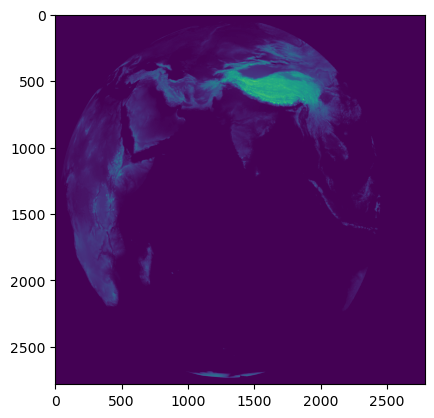

In [183]:
year = '/2022/'
times = ['0730']
#months = ['october_15']
months = ['may_15']
dates = ['0730']
i=0
for month in tqdm(months):
    for time in times:
        DEM = tff.imread(r'H:\VISCONTI_MSG/Elevation_Met9.tif')
        plt.imshow(DEM)
        #Met_9_cloud = np.pad(Met_9_cloud, (48,48))
        print('init Met9 DEM shape', Met_9_cloud.shape)
        # Define the affine transformation coefficients for the geostationary projection
        y_res = x_res = 3000
        sat_lon = 45.5
        x0, y0 = -5586000, 5586000
        Met_9_transform = rasterio.Affine(x_res, 0, x0, 0, -y_res, y0)
        # Define the geostationary projection CRS
        Met_9_crs = {'proj': 'geos', 
               'lon_0': sat_lon, 
               'h': 35786360.0,
                'a': 6378137.0,
                'b': 6356752.314, 
                'ellps': 'GRS80',
               'units': 'm',
                'sweep':'x',
               'no_defs': True}
        # Define the output shape and resolution
        y_res = 4000
        x_res = 4000
        sat_lon = 76.
        x_scew = 0.
        y_scew = 0.
        x0, y0 = -5586000, 5586000
        electro_l3_transform = rasterio.Affine(x_res, x_scew, x0, y_scew, -y_res, y0 )
        electro_l3_crs = {'proj': 'geos', 
               'lon_0': sat_lon, 
               'h': 35788248.0,
                'a': 6378137.0,
                'b': 6356752.314, 
                'ellps': 'GRS80',
               'units': 'm',
                'sweep':'x',
               'no_defs': True}
        out_shape = (2784,2784)
        # Reproject the plate caree snow map image to the geostationary projection
        reprojected_DEM_Met_9 = np.zeros(out_shape)
        reproject(
            source = DEM,
            destination = reprojected_DEM_Met_9,
            src_transform = Met_9_transform,
            src_crs = Met_9_crs,
            dst_transform = electro_l3_transform,
            dst_crs = electro_l3_crs,
            resampling = Resampling.nearest)
        #reprojected_DEM_Met_9 = (reprojected_DEM_Met_9).astype(np.uint8)
        plt.imshow(reprojected_DEM_Met_9)
        tff.imsave(r'H:/GOES_16_17_DATASET/src/ELECTRO_L3/DEM_from_Met_9.tif',(reprojected_DEM_Met_9))
        reprojected_DEM_uint8 = (reprojected_DEM_Met_9/np.max(reprojected_DEM_Met_9)*255).astype(np.uint8)
        dem_mask = reprojected_DEM_uint8.copy()
        dem_mask[dem_mask!=0] =255
        EL3_pic_with_DEM = np.dstack([reprojected_DEM_uint8,r,g])
        EL3_pic_with_DEM_mask = np.dstack([dem_mask,r,g])
        Image.fromarray(EL3_pic_with_DEM).save(r'H:/GOES_16_17_DATASET\src\ELECTRO_L3/EL3_pic_with_DEM.jpg')
        Image.fromarray(EL3_pic_with_DEM_mask).save(r'H:/GOES_16_17_DATASET\src\ELECTRO_L3/EL3_pic_with_DEM_mask.jpg')
         #Image.fromarray(EL2_pic_with_only_cloud_mask).save(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+year+'/'+month+'/El2_with_cloud_mask_MSG_'+time+'.jpg')
        print('############ REPROJECTED DEM FROM MET9 SAVED! #########')

**REPROJ EARTH DISK FROM MET8  and MET9 to L3 view**

  0%|          | 0/1 [00:00<?, ?it/s]

Met_10 DEM shape (3712, 3712)


100%|██████████| 1/1 [00:02<00:00,  2.87s/it]

############ REPROJECTED earth disk FROM MET10 SAVED! #########


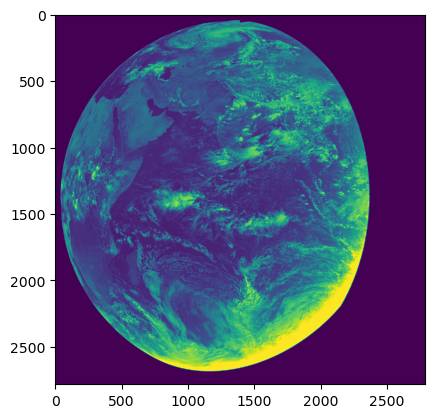

In [8]:
times = ['1400']
times = ['1400']
months = ['october_15']
dates = ['cloud_mask_1400']
year ='2021'
for month in tqdm(months):
    for time in times:
        DEM = tff.imread(r'H:/GOES_16_17_DATASET\src\ELECTRO_L3/ch1_Met9.tif')
        print('Met_10 DEM shape', DEM.shape)
        y_res = x_res = 3000
        sat_lon = 41.5#45.5
        x0, y0 = -5586000, 5586000
        Met_10_transform = rasterio.Affine(x_res, 0, x0, 0, -y_res, y0)
        # Define the geostationary projection CRS
        Met_10_crs = {'proj': 'geos', 
               'lon_0': sat_lon, 
               'h': 35786360.0,
                'a': 6378137.0,
                'b': 6356752.314, 
                'ellps': 'GRS80',
               'units': 'm',
                'sweep':'x',
               'no_defs': True}
        # Define the output shape and resolution
        y_res = 4000#y_ress[i] #2007# 2km resolution
        x_res = 4000#x_ress[i] #2002
        sat_lon = 76
        x_scew = 0.
        y_scew = 0.
        x0, y0 = -5586000, 5586000
        electro_l2_transform = rasterio.Affine(x_res, x_scew, x0, y_scew, -y_res, y0 )
        electro_l2_crs = {'proj': 'geos', 
               'lon_0': sat_lon, 
               'h': 35788248.0,
                'a': 6378137.0,
                'b': 6356752.314, 
                'ellps': 'GRS80',
               'units': 'm',
                'sweep':'x',
               'no_defs': True}
        out_shape = (2784,2784)
        # Reproject the plate caree snow map image to the geostationary projection
        reprojected_DEM = np.zeros(out_shape)
        reproject(
            source = DEM,
            destination = reprojected_DEM,
            dst_transform = electro_l2_transform,
            dst_crs=electro_l2_crs,
            src_transform = Met_10_transform,
            src_crs = Met_10_crs,
            resampling = Resampling.nearest)
        #reprojected_DEM = (reprojected_DEM).astype(np.uint8)
        plt.imshow(reprojected_DEM)
        reprojected_DEM[reprojected_DEM!=0]=255
        tff.imsave(r'H:/GOES_16_17_DATASET/src/ELECTRO_L3/earth_disk_from_Met_8.tif',(reprojected_DEM.astype(np.uint8)))
        print('############ REPROJECTED earth disk FROM MET10 SAVED! #########')